In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('Employee_Compensation.csv')

In [3]:
df.head()


,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
0,3,1400,1404,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,790.0,"SEIU, Local 1021, Misc",...,37486688,60720.01,0.00,0.00,60720.01,13653.20,14733.76,4904.34,33291.30,94011.31
1,3,9700,9703,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,39646203,91677.00,0.00,0.00,91677.00,17524.20,14733.76,7411.13,39669.09,131346.09
2,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37486043,89106.03,0.00,1540.00,90646.03,17327.20,14733.76,7401.92,39462.88,130108.91
3,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37615772,85581.11,3355.94,337.75,89274.80,16359.16,14151.56,7096.21,37606.93,126881.73
4,3,2900,2905,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37500212,86457.00,0.00,2090.00,88547.00,16925.97,14733.76,7257.89,38917.62,127464.62


In [4]:
df.shape

(840505, 22)

In [5]:
df.isnull().sum()

Organization Group Code      0
Job Family Code              0
Job Code                     0
Year Type                    0
Year                         0
Organization Group           0
Department Code              2
Department                   2
Union Code                 180
Union                      179
Job Family                   0
Job                          5
Employee Identifier          0
Salaries                     0
Overtime                     0
Other Salaries               0
Total Salary                 0
Retirement                   0
Health and Dental            0
Other Benefits               0
Total Benefits               0
Total Compensation           0
dtype: int64

In [6]:
#Drop Nan values. 187 in total.
df.dropna(inplace=True)

In [7]:
df.shape

(840318, 22)

In [8]:
df.isnull().sum()

Organization Group Code    0
Job Family Code            0
Job Code                   0
Year Type                  0
Year                       0
Organization Group         0
Department Code            0
Department                 0
Union Code                 0
Union                      0
Job Family                 0
Job                        0
Employee Identifier        0
Salaries                   0
Overtime                   0
Other Salaries             0
Total Salary               0
Retirement                 0
Health and Dental          0
Other Benefits             0
Total Benefits             0
Total Compensation         0
dtype: int64

In [9]:
df.dtypes

Organization Group Code      int64
Job Family Code             object
Job Code                    object
Year Type                   object
Year                         int64
Organization Group          object
Department Code             object
Department                  object
Union Code                 float64
Union                       object
Job Family                  object
Job                         object
Employee Identifier          int64
Salaries                   float64
Overtime                   float64
Other Salaries             float64
Total Salary               float64
Retirement                 float64
Health and Dental          float64
Other Benefits             float64
Total Benefits             float64
Total Compensation         float64
dtype: object

In [10]:
df.columns

Index(['Organization Group Code', 'Job Family Code', 'Job Code', 'Year Type',
       'Year', 'Organization Group', 'Department Code', 'Department',
       'Union Code', 'Union', 'Job Family', 'Job', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation'],
      dtype='object')

In [11]:
df['Job Family Code'].unique()

array(['1400', '9700', '2900', '9900', '7300', '1900', '9100', '5200',
       '8200', '1000', '7500', 'Q000', '9200', '0000', '2700', '3500',
       '1800', '6100', '6300', '7200', '0900', '5500', '6200', '5300',
       '1600', '8100', '4200', '1200', '1300', '1500', '2300', '2500',
       '2200', '2400', '2800', '2600', '7100', '2100', '3400', '1100',
       '7400', '5100', '1700', 'H000', '3300', '5600', '4300', '8300',
       '8400', '3600', '9500', '5400', '8600', '9300', '4100', '3200',
       '__UNASSIGNED__', 'SCRT', 'SFRA'], dtype=object)

In [12]:
df.Job.unique()

array(['Clerk', 'HSA Emp & Training Spec II', 'HSA Social Worker', ...,
       'Vet Laboratory Technologist', 'Senior Plan Checker',
       'Parking Hearing Supervisor'], dtype=object)

In [13]:
df['Job Code'].unique()

array(['1404', '9703', '2918', ..., '2933', '2440', '6266'], dtype=object)

In [14]:
df['Year Type'].unique()

array(['Fiscal', 'Calendar'], dtype=object)

In [15]:
df['Organization Group'].unique()

array(['Human Welfare & Neighborhood Development',
       'Public Works, Transportation & Commerce', 'Public Protection',
       'General Administration & Finance', 'Culture & Recreation',
       'Community Health', 'General City Responsibilities'], dtype=object)

In [16]:
df['Job Family'].unique()

array(['Clerical, Secretarial & Steno', 'Community Development',
       'Human Services', 'Public Service Aide', 'Journeyman Trade',
       'Purchasing & Storekeeping', 'Street Transit',
       'Professional Engineering', 'Protection & Apprehension',
       'Information Systems', 'Semi-Skilled & General Labor',
       'Police Services', 'Airport Operation', 'Untitled',
       'Housekeeping & Laundry', 'Museum & Cultural Affairs',
       'Budget, Admn & Stats Analysis', 'Health & Sanitation Inspection',
       'Construction Inspection', 'Supervisory-Labor & Trade',
       'Management', 'Construction Project Mgmt',
       'Public Safety Inspection', 'Sub-Professional Engineering',
       'Payroll, Billing & Accounting', 'Legal & Court',
       'Appraisal & Taxation', 'Personnel', 'Pub Relations & Spec Assts',
       'Administrative Secretarial', 'Nursing', 'Med Therapy & Auxiliary',
       'Medical & Dental', 'Lab, Pharmacy & Med Techs', 'Public Health',
       'Dietary & Food', 'Adminis

In [17]:
df['Department Code'].unique()

array(['HSA', 'MTA', 'POL', 'AIR', 'CAT', 'ART', 'ASR', 'BOS', 'CHF',
       'CON', 'CPC', 'BOA', 'CFC', 'CSS', 'DAT', 'CRT', 'DBI', 'CSC',
       'DPH', 'DEM', 'DPA', 'DPW', 'ECN', 'FIR', 'FAM', 'ENV', 'ETH',
       'HOM', 'HRD', 'HRC', 'JUV', 'HSS', 'LIB', 'MYR', 'PDR', 'SHF',
       'RET', 'RNT', 'SCI', 'REG', 'ADP', 'TIS', 'PUC', 'AAM', 'ADM',
       'PRT', 'REC', 'LLB', 'TTX', 'WAR', 'WOM', 'PAB', 'DSS', 'ECD',
       'DEC', 'SDA', 'WTR', 'UNA', 'HHP', 'CWP', 'CII', 'CLP'],
      dtype=object)

In [18]:
df['Department'].unique()

array(['Human Services', 'Municipal Transportation Agcy', 'Police',
       'Airport Commission', 'City Attorney', 'Art Commission',
       'Assessor', 'Board Of Supervisors', 'Children Youth & Families',
       'Controller', 'City Planning', 'Board Of Appeals',
       'Children & Families Commission', 'Child Support Services',
       'District Attorney', 'Trial Courts', 'Building Inspection',
       'Civil Service Commission', 'Public Health',
       'Dept of Emergency Management', 'Dept of Police Accountablility',
       'Department Of Public Works', 'Economic Workforce Development',
       'Fire Department', 'Fine Arts Museum', 'Environment',
       'Ethics Commission', 'Homeless Services', 'Human Resources',
       'Human Rights Commission', 'Juvenile Court',
       'Health Service System', 'Public Library', 'Mayor',
       'Public Defender', 'Sheriff', 'Retirement Services',
       'Rent Arbitration Board', 'Academy Of Sciences', 'Registrar',
       'Adult Probation', 'Department o

In [19]:
df['Union'].unique()

array(['SEIU, Local 1021, Misc', 'Laborers, Local 261',
       'Stationary Engineers, Local 39', 'TWU, Local 250-A, TransitOpr',
       'Auto Machinist, Local 1414', 'Prof & Tech Eng, Local 21',
       'Electrical Workers, Local 6', 'SF City Workers United', 'POA',
       'Teamsters, Local 853', 'Carpenters, Local 22',
       'Plumbers, Local 38', 'Municipal Exec Assoc, Misc',
       'Sheet Metal Workers, Local 104', 'BrickLayers, Local 3',
       'Municipal Attorneys Assoc', 'Member, Board Or Commission',
       'TWU, Local 200', 'Commissioner No Benefits',
       'Utd Pub EmpL790 SEIU-Crt Clrks', 'Court-Unrep Professional',
       'SFDA Investigators Assn', 'Court-Supr Court Interpreters',
       'Court-MEA', 'Court Local 21 Staff Attorneys',
       'Building Inspects - 6331/33', 'Court-Local 21 Professional',
       'Court-Court Reporters', 'Court-Judge',
       'SF Courts Commissioner Assoc', 'SEIU, Local 1021, RN',
       'Physician/Dentists 8-CC, UAPD', 'Teamsters, Local 856, Mul

In [20]:
df.shape

(840318, 22)

In [21]:
df.columns

Index(['Organization Group Code', 'Job Family Code', 'Job Code', 'Year Type',
       'Year', 'Organization Group', 'Department Code', 'Department',
       'Union Code', 'Union', 'Job Family', 'Job', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation'],
      dtype='object')

# Level 1 Analysis

<Axes: >

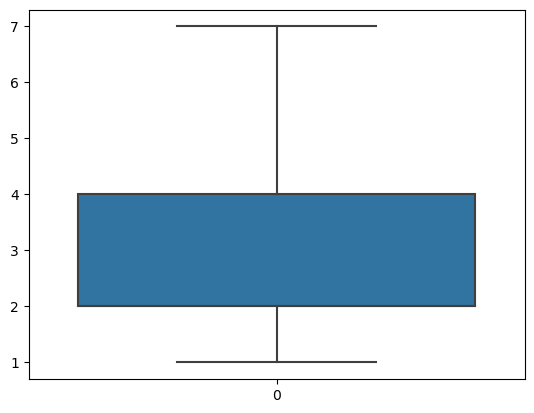

In [22]:
#Organization Group Code

sns.boxplot(df['Organization Group Code'])

<Axes: xlabel='Organization Group Code', ylabel='count'>

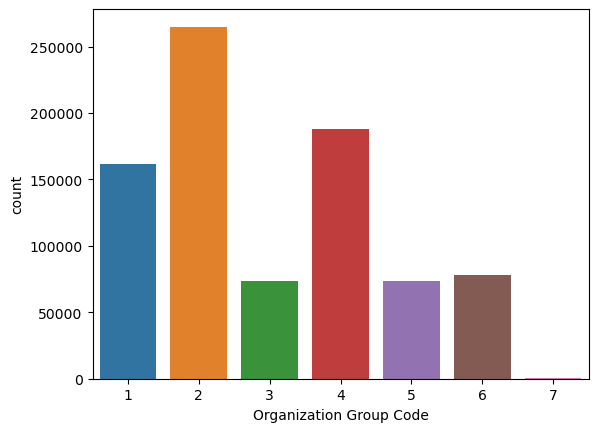

In [23]:
sns.countplot(x=df['Organization Group Code'])

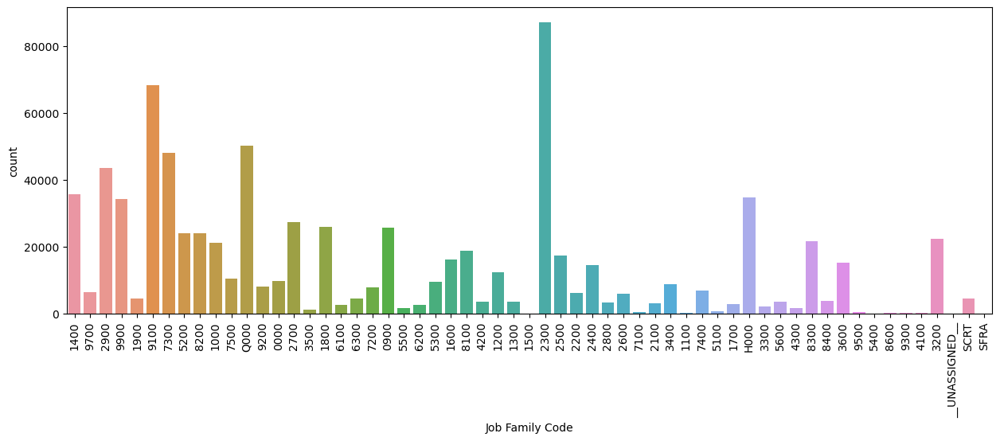

In [170]:
#Job Family Code

fig,ax=plt.subplots(figsize=(15,5))
#sns.boxplot(df['Job Family Code'],ax=ax[0])
sns.countplot(x=df['Job Family Code'])
plt.xticks(rotation=90)
plt.show()

<Axes: xlabel='Job Code', ylabel='Count'>

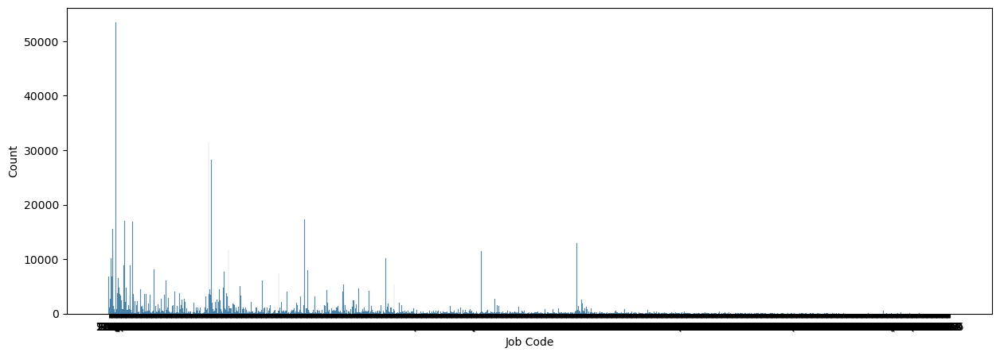

In [25]:
#Job Code

fig,ax=plt.subplots(figsize=(15,5))
sns.histplot(x=df['Job Code'])

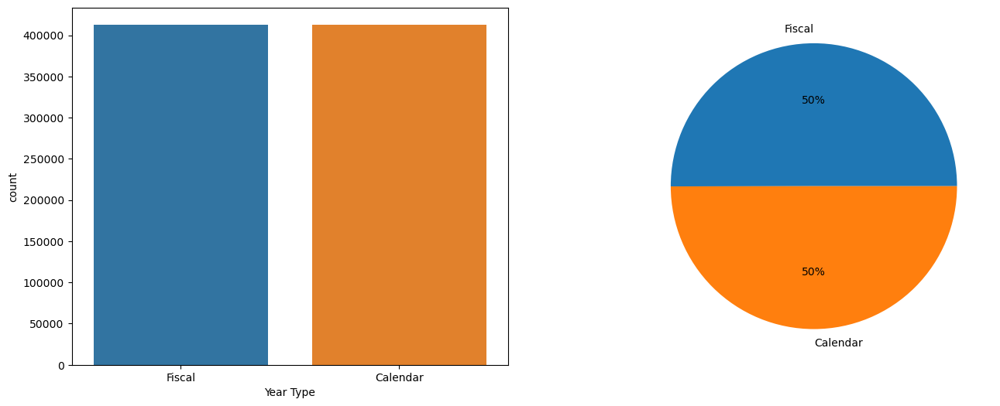

In [171]:
#Year Type
fig,ax=plt.subplots(1,2,figsize=(16,6))
sns.countplot(x=df['Year Type'],ax=ax[0])
plt.pie(df['Year Type'].value_counts(),labels=df['Year Type'].unique(),autopct='%.0f%%')
plt.show()

In [27]:
df['Year Type'].unique()

array(['Fiscal', 'Calendar'], dtype=object)

<Axes: >

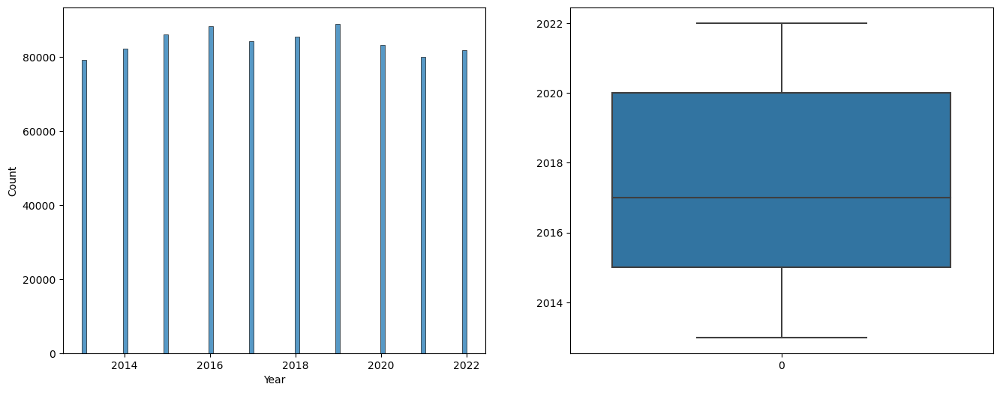

In [28]:
#Year
fig,ax=plt.subplots(1,2,figsize=(16,6))
sns.histplot(df.Year,ax=ax[0])
sns.boxplot(df.Year)

In [29]:
#Organization Group
df['Organization Group'].unique()

array(['Human Welfare & Neighborhood Development',
       'Public Works, Transportation & Commerce', 'Public Protection',
       'General Administration & Finance', 'Culture & Recreation',
       'Community Health', 'General City Responsibilities'], dtype=object)

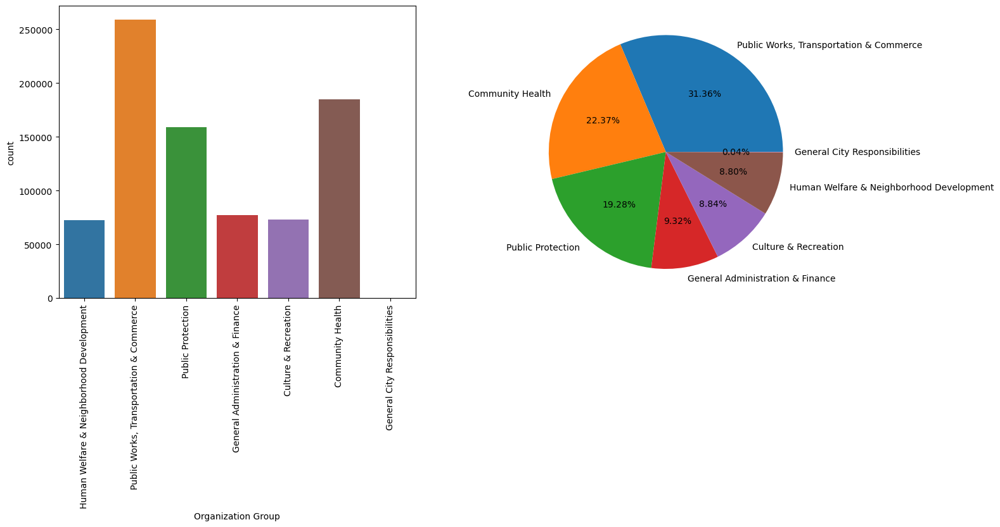

In [200]:
fig,ax=plt.subplots(1,2,figsize=(16,6))
sns.countplot(x=df['Organization Group'],ax=ax[0])
plt.pie(df['Organization Group'].value_counts(),labels=df['Organization Group'].value_counts().index,autopct='%.2f%%')
ax[0].set_xticklabels(df['Organization Group'].unique(),rotation=90)

plt.show()

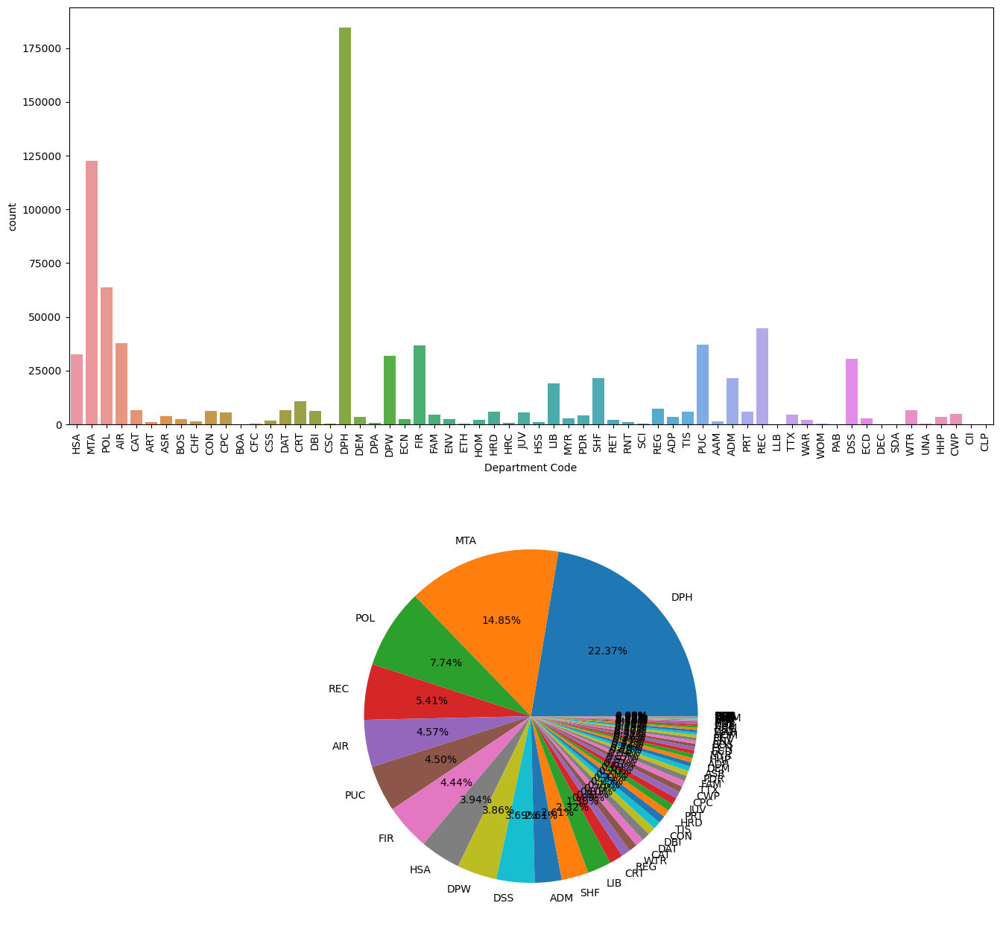

In [201]:
#Department Code
fig,ax=plt.subplots(2,1,figsize=(16,16))
sns.countplot(x=df['Department Code'],ax=ax[0])
plt.pie(df['Department Code'].value_counts(),labels=df['Department Code'].value_counts().index,autopct='%.2f%%')
ax[0].set_xticklabels(df['Department Code'].unique(),rotation=90)
plt.show()

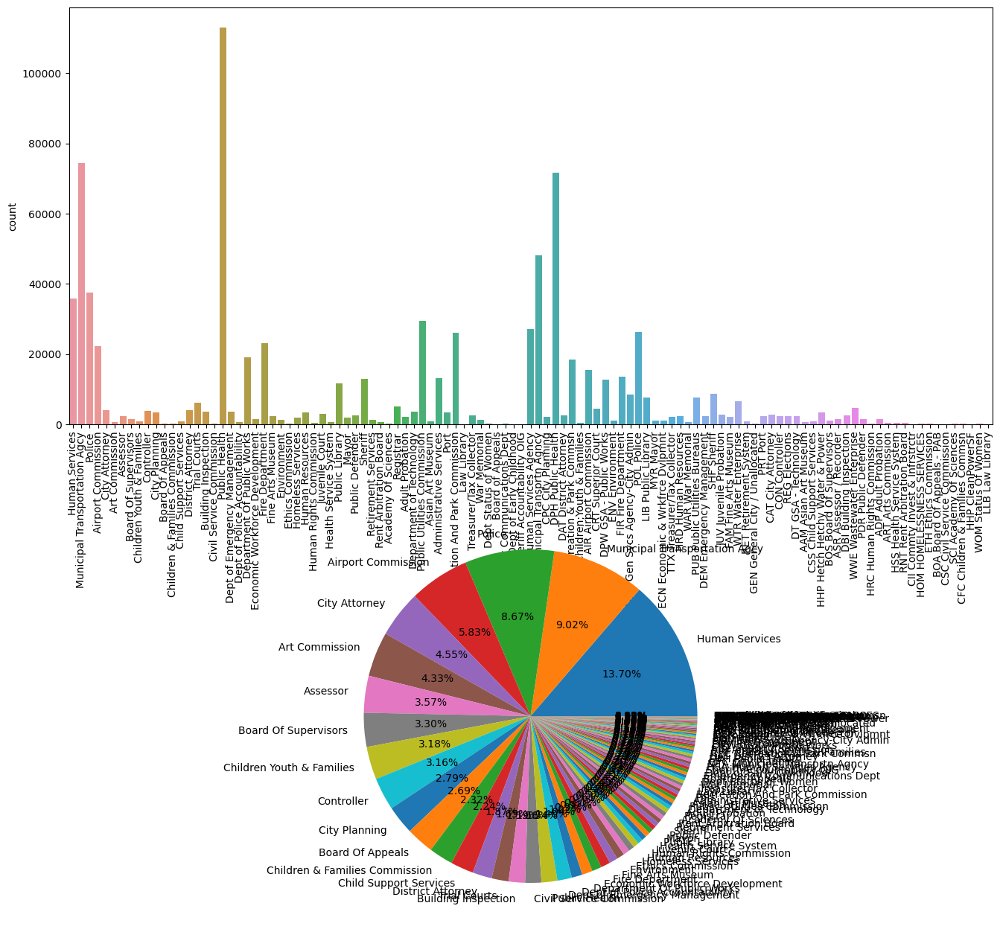

In [174]:
#Department
fig,ax=plt.subplots(2,1,figsize=(16,16))
sns.countplot(x=df['Department'],ax=ax[0])
plt.pie(df['Department'].value_counts(),labels=df['Department'].unique(),autopct='%.2f%%')
ax[0].set_xticklabels(df['Department'].unique(),rotation=90)
plt.show()

<Axes: xlabel='Union Code', ylabel='Count'>

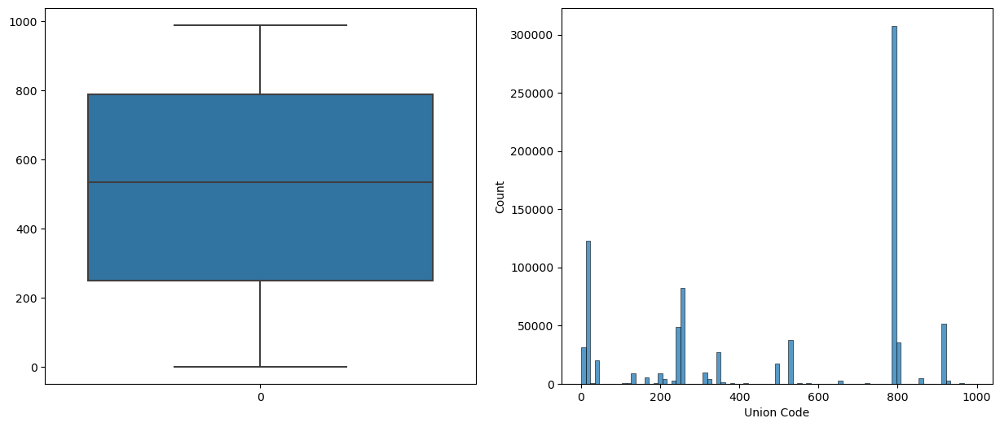

In [33]:
#Union Code
fig,ax=plt.subplots(1,2,figsize=(15,6))
sns.boxplot(df['Union Code'],ax=ax[0])
sns.histplot(x=df['Union Code'])

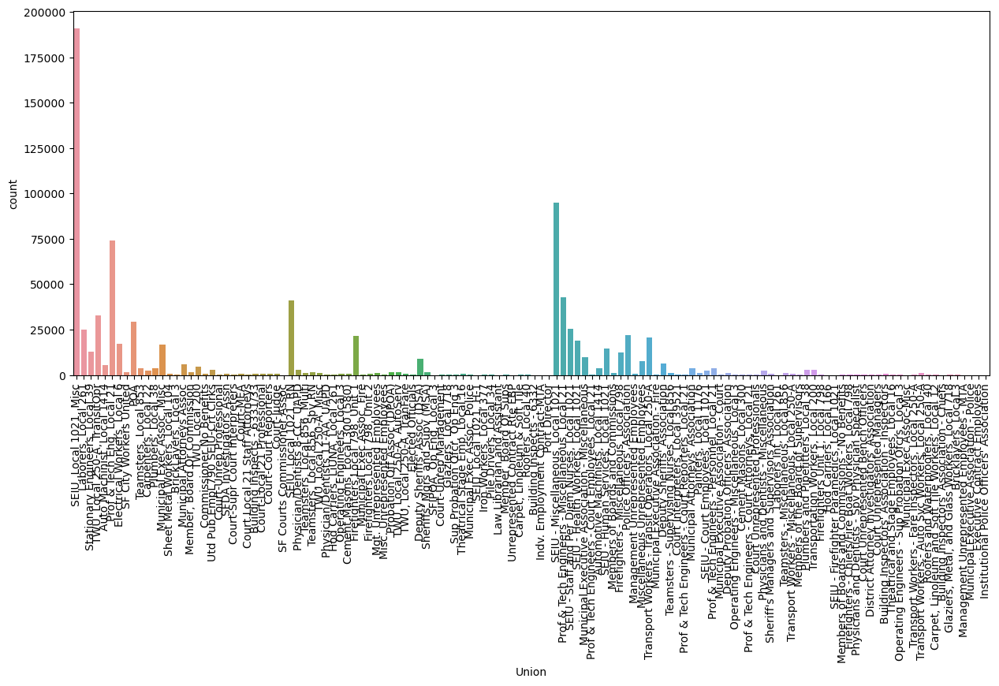

In [34]:
#Union
fig,ax=plt.subplots(figsize=(15,6))
sns.countplot(x=df['Union'])
ax.set_xticklabels(df['Union'].unique(),rotation=90)
plt.show()

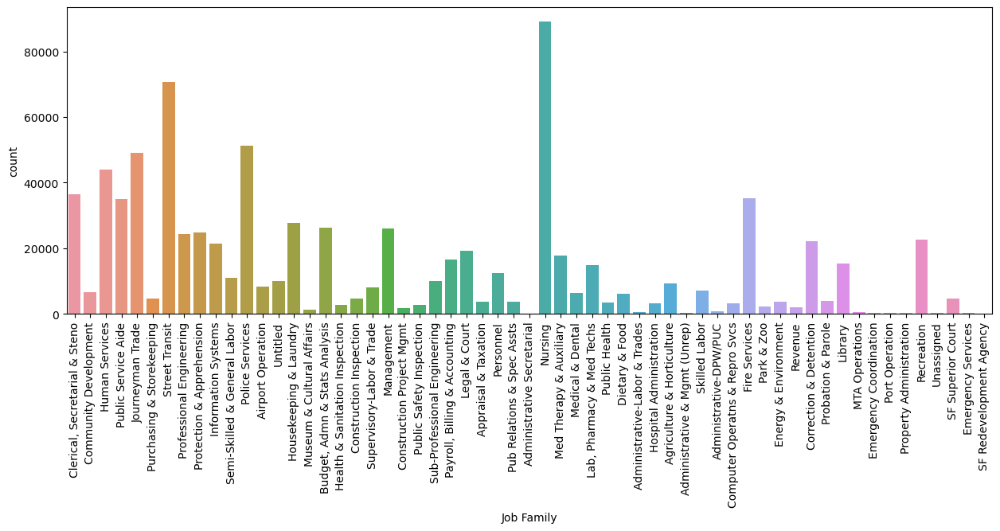

In [35]:
#Job Family
fig,ax=plt.subplots(figsize=(15,5))
sns.countplot(x=df['Job Family'])
ax.set_xticklabels(df['Job Family'].unique(),rotation=90)
plt.show()

In [36]:
#Employee Identifier
df['Employee Identifier'].unique()

array([37486688, 39646203, 37486043, ...,    53779,    53851,    53852],
      dtype=int64)

In [37]:

df['Employee Identifier'].unique().shape

(470987,)

<Axes: xlabel='Employee Identifier', ylabel='Count'>

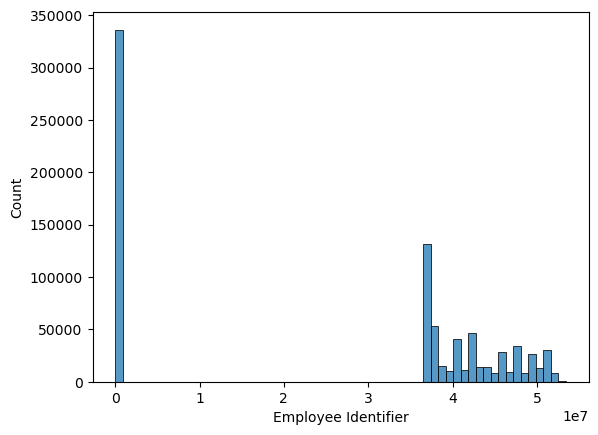

In [38]:
sns.histplot(x=df['Employee Identifier'])

<Axes: >

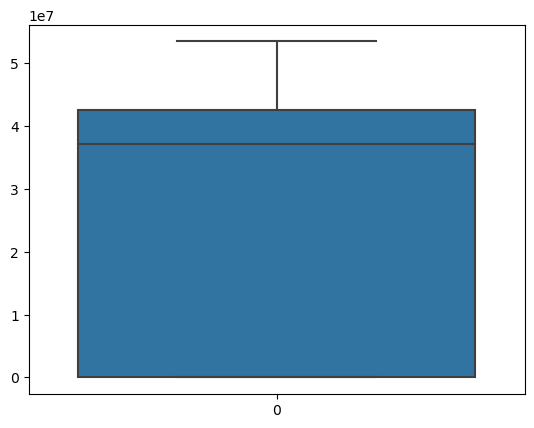

In [39]:
sns.boxplot(df['Employee Identifier'])

<Axes: xlabel='Salaries', ylabel='Count'>

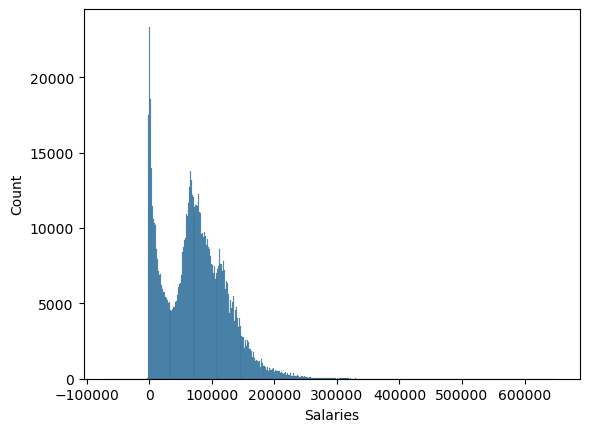

In [40]:
#Salaries
sns.histplot(x=df['Salaries'])

<Axes: >

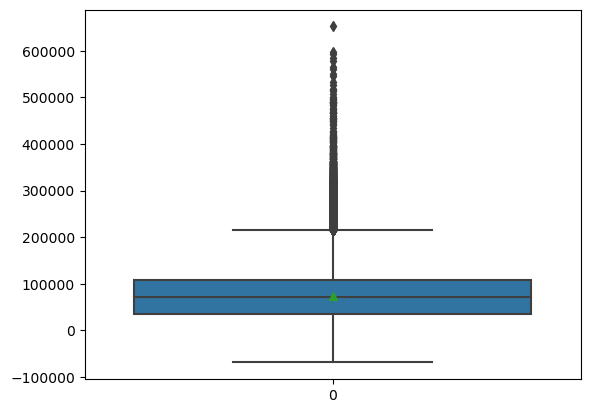

In [41]:
sns.boxplot(df['Salaries'],showmeans=True)

In [42]:
x=df.loc[(df.Salaries<=0)].index

In [43]:
x

Int64Index([    13,     18,     33,     53,     66,     72,     74,     75,
                85,     87,
            ...
            839289, 839318, 839430, 839431, 839613, 839618, 839622, 839731,
            840405, 840502],
           dtype='int64', length=13477)

In [44]:
#dropping salaries<0
df.drop(x,inplace=True)

In [45]:
df.shape

(826841, 22)

In [46]:
#Overtime

x=df.loc[(df.Overtime<0)].index


In [47]:
x

Int64Index([ 44429,  53040,  54345,  56579,  58395,  89907,  91609,  91900,
             94185, 101465, 104785, 147165, 149467, 153508, 154120, 179558,
            200630, 206363, 253526, 274639, 276205, 284691, 294066, 308695,
            331339, 370807, 406098, 419269, 419962, 432753, 465436, 468051,
            473622, 483172, 490225, 490525, 499785, 500735, 500836, 505466,
            505471, 517349, 521698, 521706, 531376, 538341, 550442, 609940,
            612323, 612983, 629958, 629963, 631321, 636974, 636979, 641036,
            674129, 704978, 720345, 742215, 761290, 764636, 791737, 794007,
            803228, 817586, 820955, 824173],
           dtype='int64')

In [48]:
df.drop(x,inplace=True)

In [49]:
df.shape

(826773, 22)

<Axes: xlabel='Overtime', ylabel='Count'>

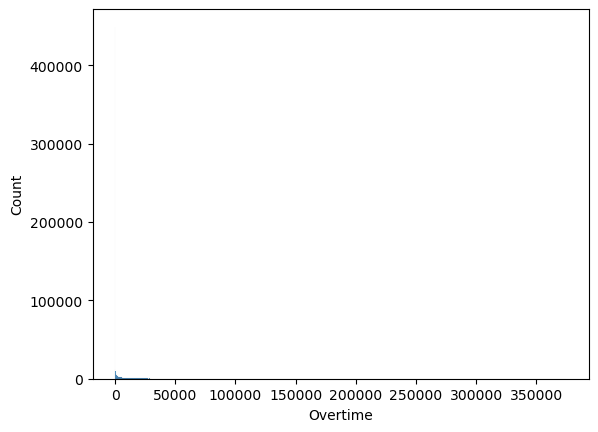

In [50]:
sns.histplot(x=df.Overtime)

<Axes: >

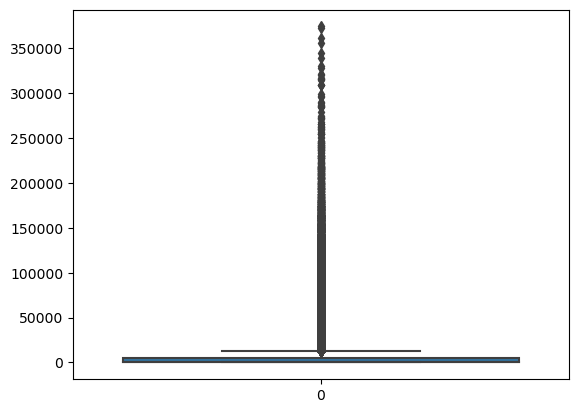

In [51]:
sns.boxplot(df.Overtime)

In [52]:
#df.loc[(df.Overtime>100000)]

In [53]:
#Other Salaries
x=df[(df['Other Salaries']<0)].index
df.drop(x,inplace=True)

In [54]:
df.shape

(826662, 22)

<Axes: >

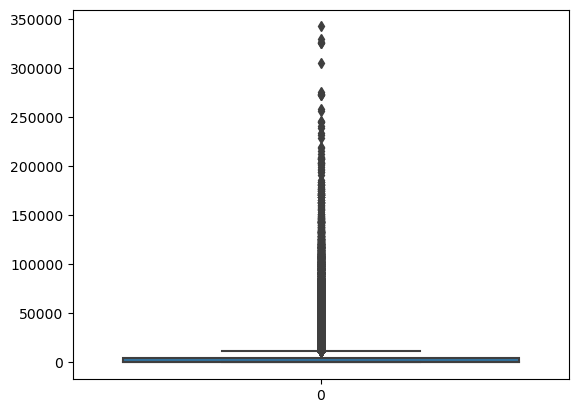

In [55]:
sns.boxplot(df['Other Salaries'])

In [56]:
#Total Salary
df[(df['Total Salary']<=0)]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation


<Axes: >

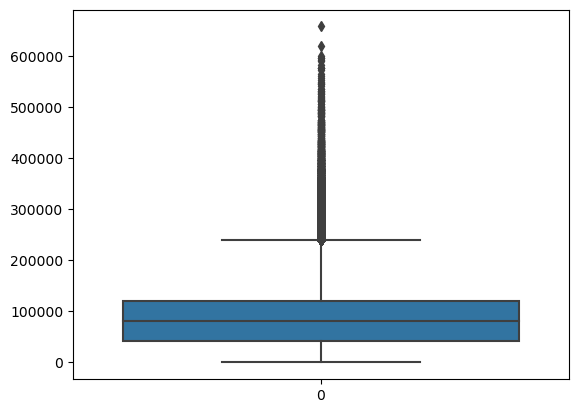

In [57]:
sns.boxplot(df['Total Salary'])

<Axes: xlabel='Total Salary', ylabel='Count'>

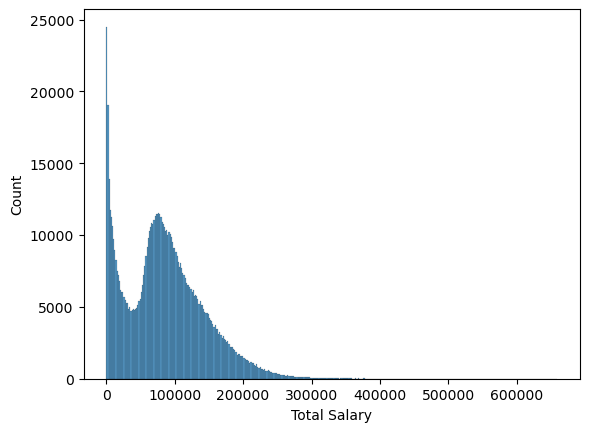

In [58]:
sns.histplot(x=df['Total Salary'])

In [59]:
#Deleting below zero values
x=df[(df['Retirement']<0)|(df['Health and Dental']<0)|(df['Other Benefits']<0)|(df['Total Benefits']<0)|(df['Total Compensation']<=0)].index
df.drop(x,inplace=True)

In [60]:
df.shape

(825766, 22)

<Axes: >

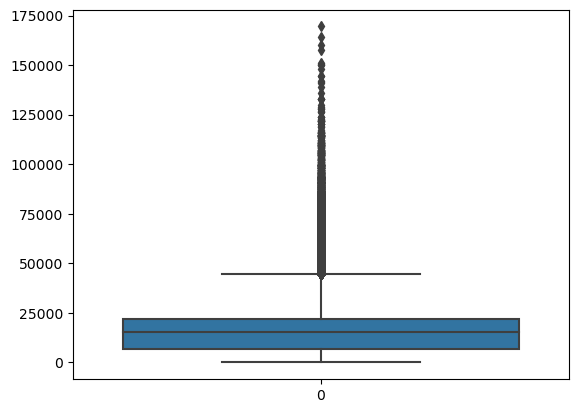

In [61]:
#Retirement
sns.boxplot(df.Retirement)

<Axes: xlabel='Retirement', ylabel='Count'>

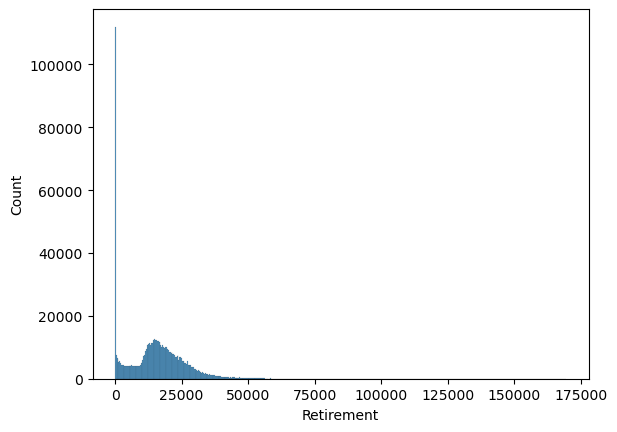

In [62]:
sns.histplot(x=df.Retirement)

<Axes: >

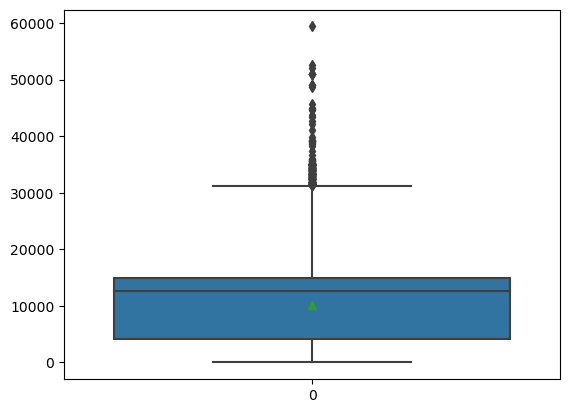

In [63]:
#Health and Dental
sns.boxplot(df['Health and Dental'],showmeans=True)

<Axes: xlabel='Health and Dental', ylabel='Count'>

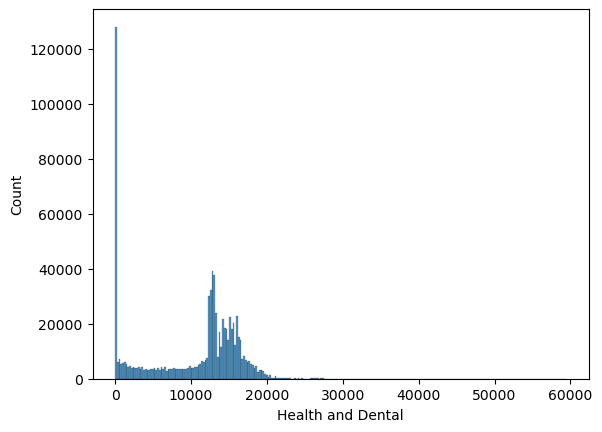

In [64]:
sns.histplot(x=df['Health and Dental'])

<Axes: >

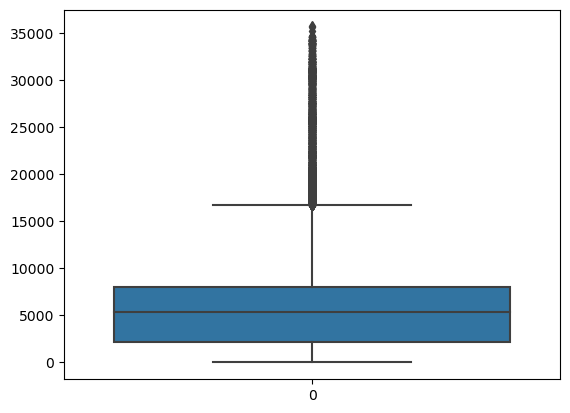

In [65]:
#Other Benefits
sns.boxplot(df['Other Benefits'])

<Axes: xlabel='Other Benefits', ylabel='Count'>

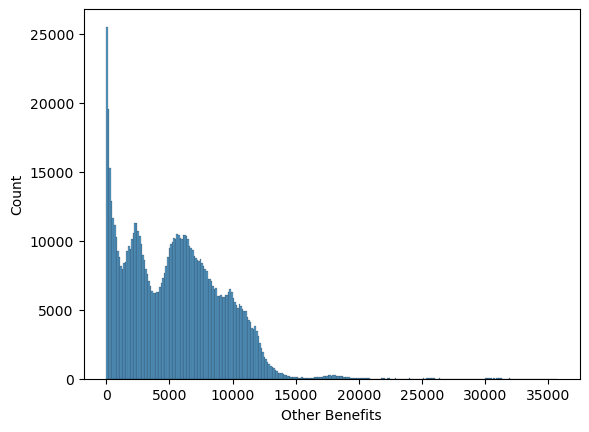

In [66]:
sns.histplot(x=df['Other Benefits'])

<Axes: >

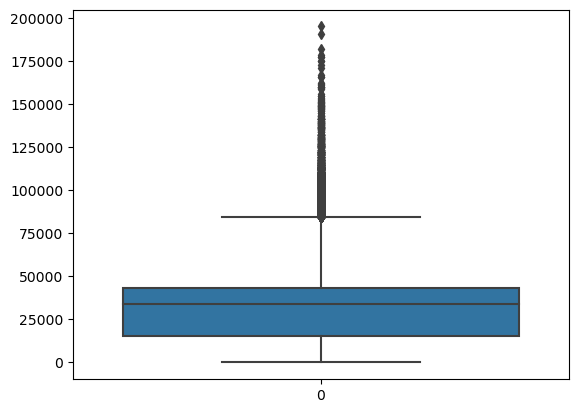

In [67]:
#Total Benefits
sns.boxplot(df['Total Benefits'])

<Axes: xlabel='Total Benefits', ylabel='Count'>

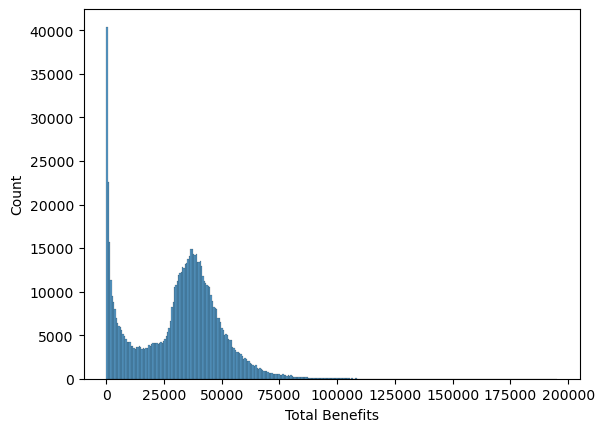

In [68]:
sns.histplot(x=df['Total Benefits'])

<Axes: >

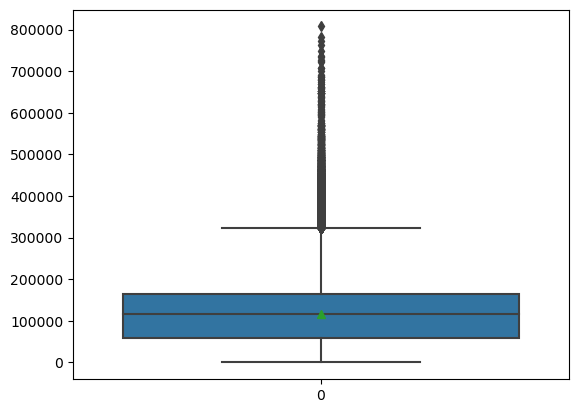

In [69]:
#Total Compensation
sns.boxplot(df['Total Compensation'],showmeans=True)

<Axes: xlabel='Total Compensation', ylabel='Count'>

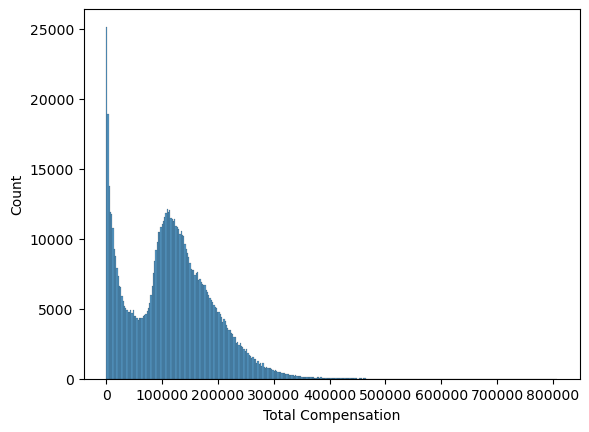

In [70]:
sns.histplot(x=df['Total Compensation'])

## Level 2 Analysis


In [71]:
#Organization Group Code vs Total Compensation

<Axes: xlabel='Organization Group Code', ylabel='Total Compensation'>

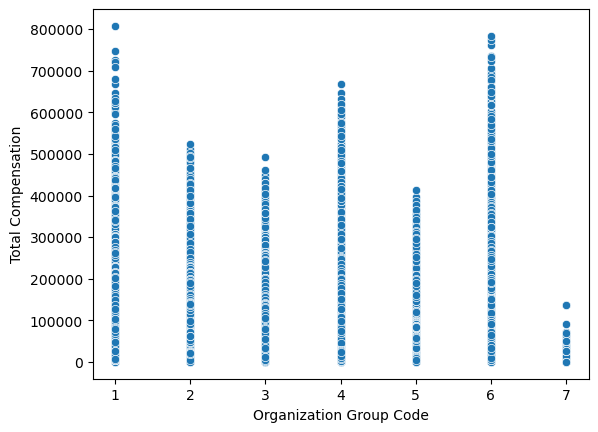

In [72]:
sns.scatterplot(x=df['Organization Group Code'],y=df['Total Compensation'])

<Axes: xlabel='Organization Group Code', ylabel='Total Compensation'>

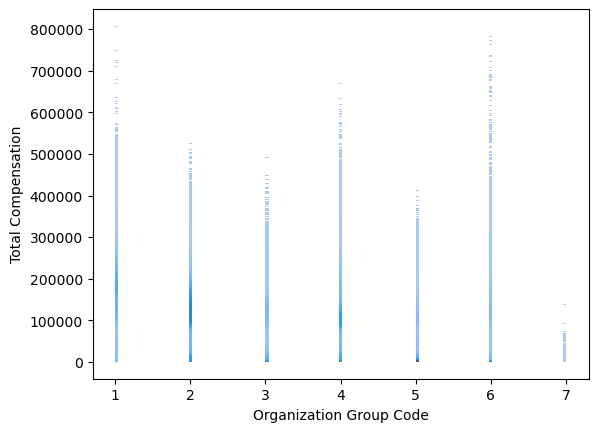

In [73]:
sns.histplot(x=df['Organization Group Code'],y=df['Total Compensation'])

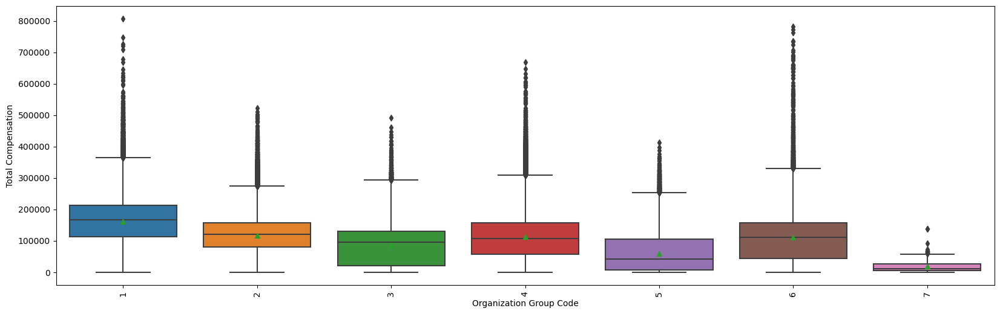

In [179]:
plt.figure(figsize=(20,6))
sns.boxplot(x=df['Organization Group Code'],y=df['Total Compensation'],showmeans=True)
plt.xticks(rotation=90)
plt.show()

In [74]:
#Total Compensation vs Job Family Code


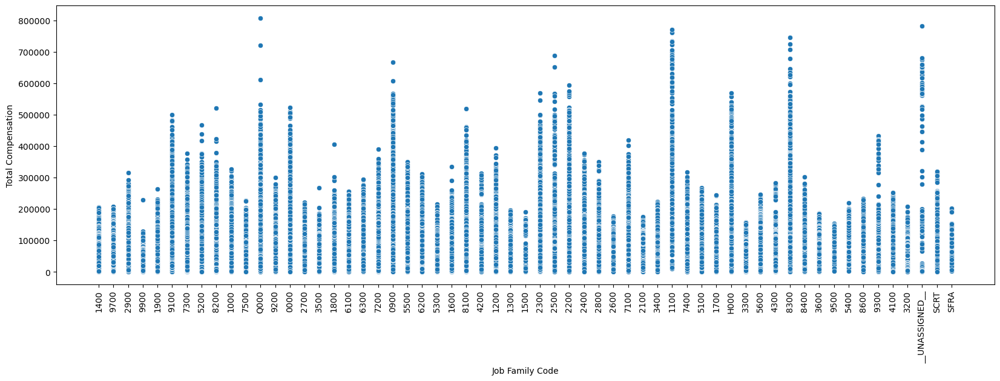

In [176]:
plt.figure(figsize=(20,6))
sns.scatterplot(x=df['Job Family Code'],y=df['Total Compensation'])
plt.xticks(rotation=90)
plt.show()

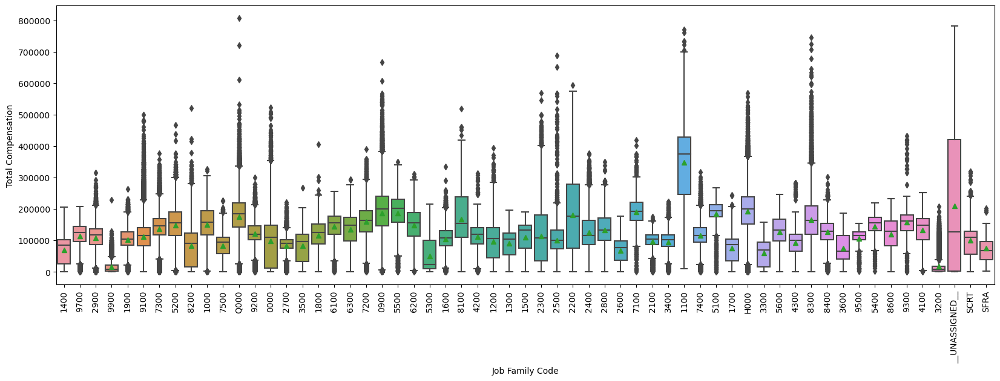

In [178]:
plt.figure(figsize=(20,6))
sns.boxplot(x=df['Job Family Code'],y=df['Total Compensation'],showmeans=True)
plt.xticks(rotation=90)
plt.show()

In [77]:
#Total Compensation vs Job Code

<Axes: xlabel='Job Code', ylabel='Total Compensation'>

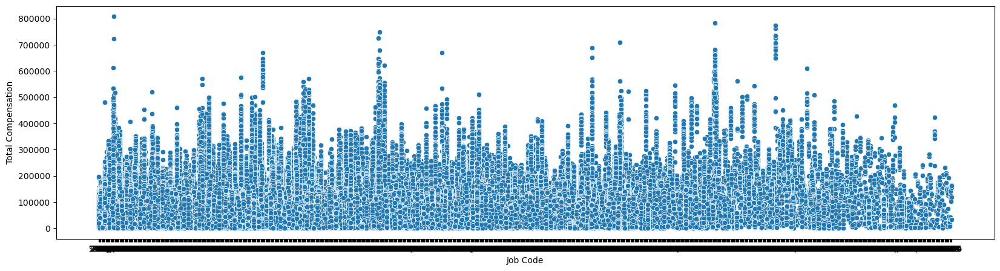

In [78]:
plt.subplots(figsize=(20,5))
sns.scatterplot(x=df['Job Code'],y=df['Total Compensation'])

In [79]:
#Total Compensation vs Year Type

<Axes: xlabel='Year Type', ylabel='Total Compensation'>

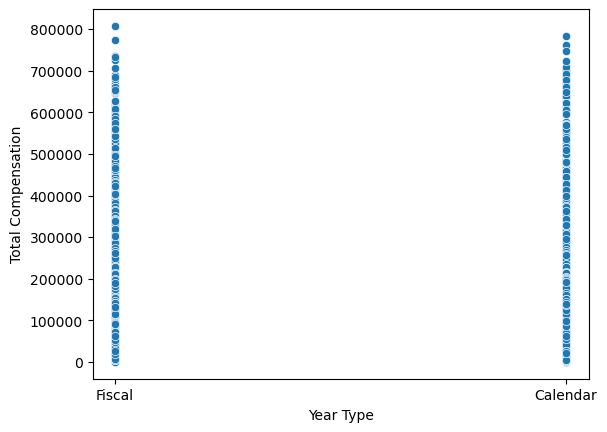

In [80]:
sns.scatterplot(x=df['Year Type'],y=df['Total Compensation'])

<Axes: xlabel='Year Type', ylabel='Total Compensation'>

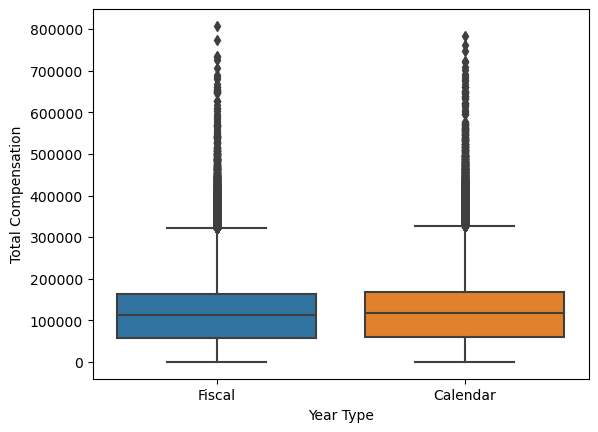

In [81]:
sns.boxplot(x='Year Type', y='Total Compensation',data=df)

In [82]:
#vs Year

<Axes: xlabel='Year', ylabel='Total Compensation'>

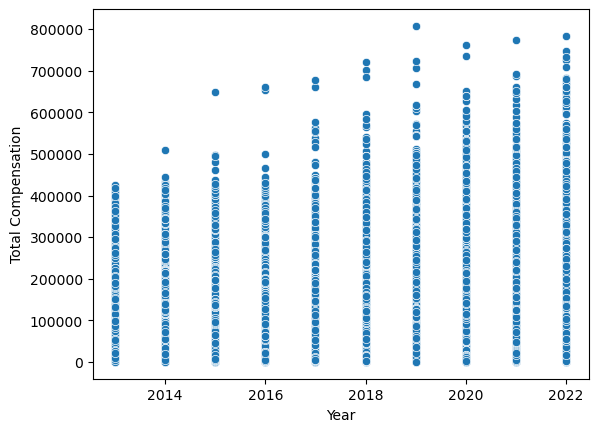

In [83]:
sns.scatterplot(x=df['Year'],y=df['Total Compensation'])

<Axes: xlabel='Year', ylabel='Total Compensation'>

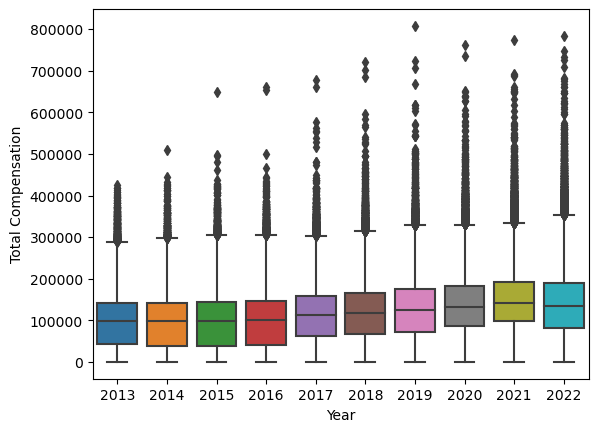

In [84]:
sns.boxplot(x='Year', y='Total Compensation',data=df)

In [85]:
#vs Organization Group

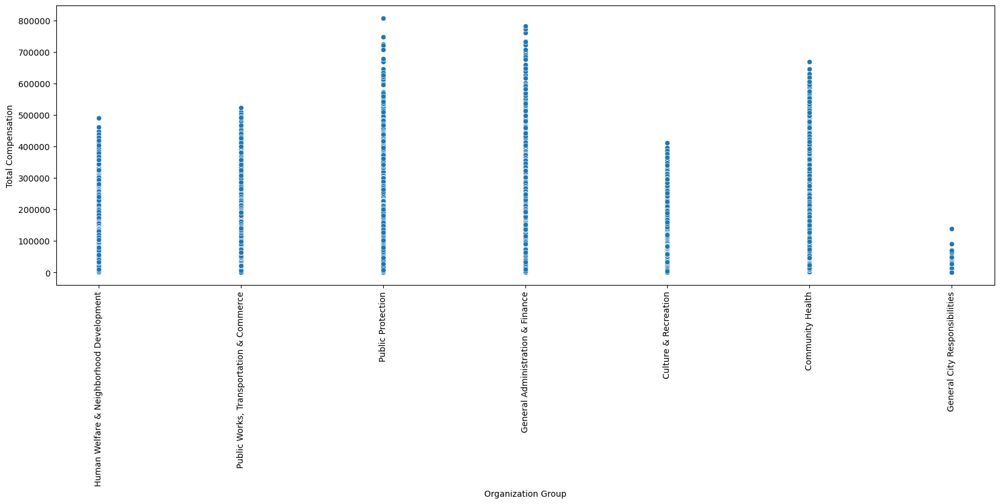

In [180]:
plt.figure(figsize=(20,6))
sns.scatterplot(x=df['Organization Group'],y=df['Total Compensation'])
plt.xticks(rotation=90)
plt.show()

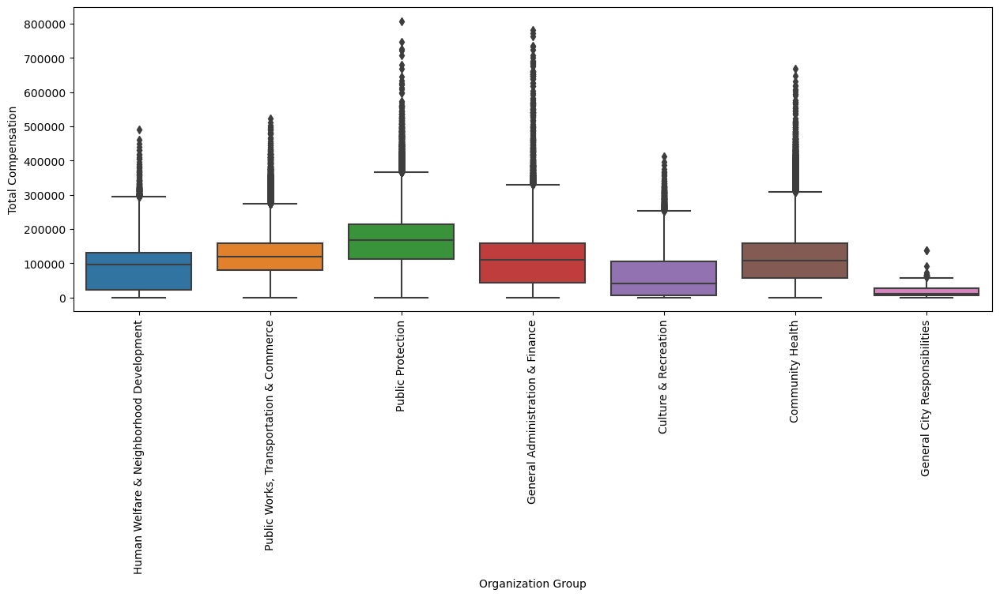

In [87]:

fig,ax=plt.subplots(figsize=(15,5))
sns.boxplot(x=df['Organization Group'],y=df['Total Compensation'])
ax.set_xticklabels(df['Organization Group'].unique(),rotation=90)
plt.show()

In [88]:
#vs Department Code


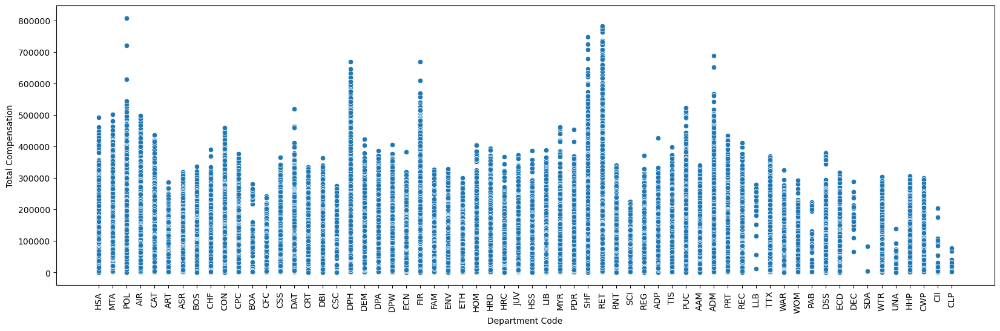

In [181]:
plt.figure(figsize=(20,6))
sns.scatterplot(x=df['Department Code'],y=df['Total Compensation'])
plt.xticks(rotation=90)
plt.show()

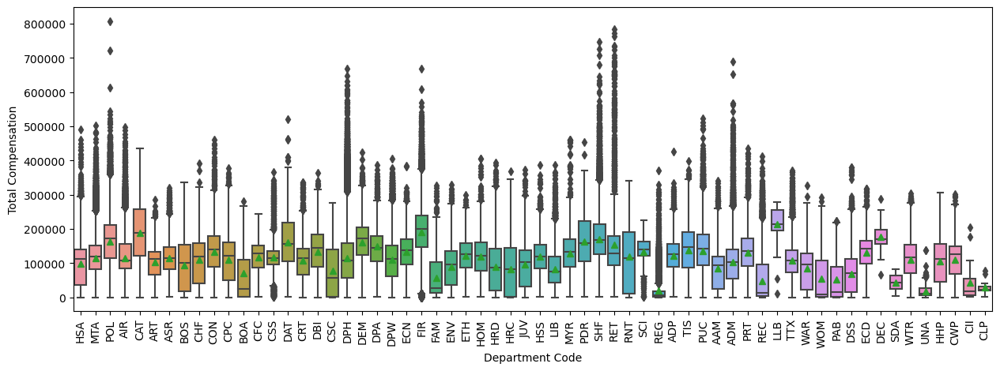

In [182]:
fig,ax=plt.subplots(figsize=(15,5))
sns.boxplot(x=df['Department Code'],y=df['Total Compensation'],showmeans=True)
ax.set_xticklabels(df['Department Code'].unique(),rotation=90)
plt.show()

In [91]:
#vs Department

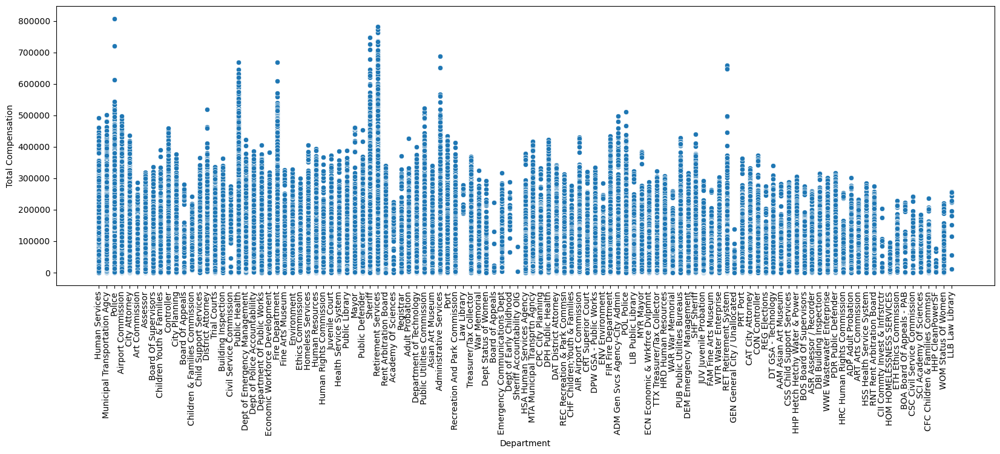

In [183]:
plt.figure(figsize=(20,6))
sns.scatterplot(x=df['Department'],y=df['Total Compensation'])
plt.xticks(rotation=90)
plt.show()

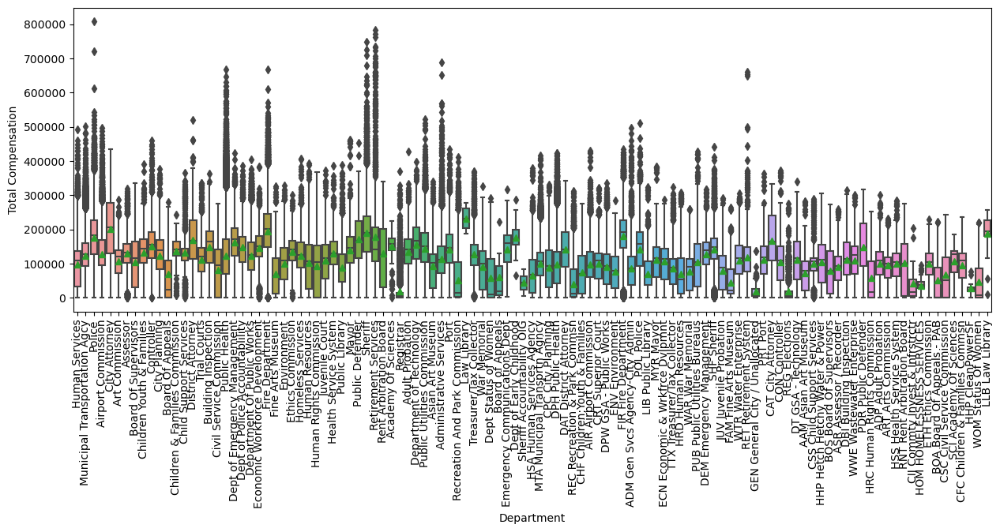

In [184]:
fig,ax=plt.subplots(figsize=(15,5))
sns.boxplot(x=df['Department'],y=df['Total Compensation'],showmeans=True)
ax.set_xticklabels(df['Department'].unique(),rotation=90)
plt.show()

In [94]:
#vs Union Code

<Axes: xlabel='Union Code', ylabel='Total Compensation'>

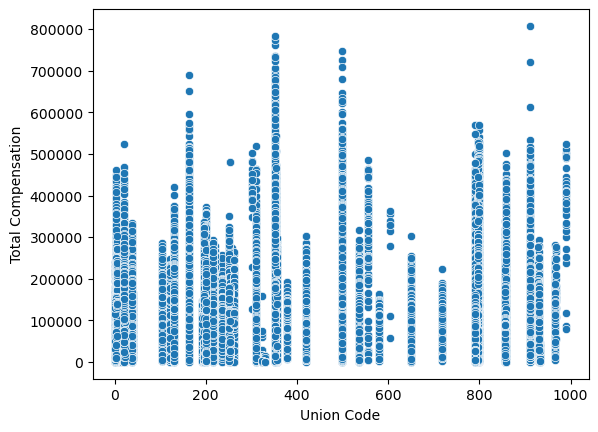

In [95]:
sns.scatterplot(x=df['Union Code'],y=df['Total Compensation'])

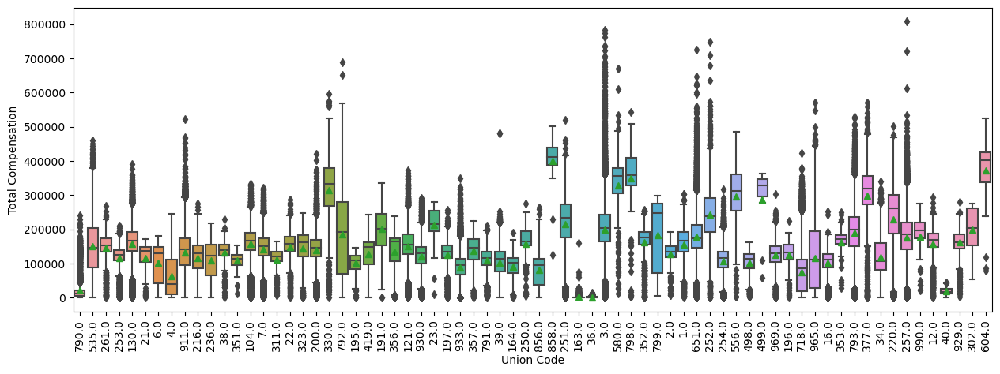

In [185]:
fig,ax=plt.subplots(figsize=(15,5))
sns.boxplot(x=df['Union Code'],y=df['Total Compensation'],showmeans=True)
ax.set_xticklabels(df['Union Code'].unique(),rotation=90)
plt.show()

In [97]:
#vs Union

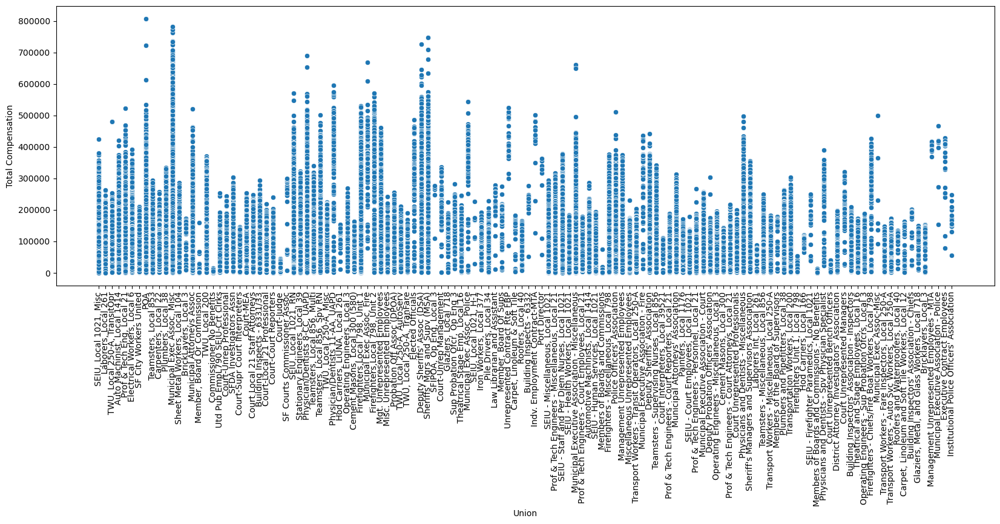

In [186]:
plt.figure(figsize=(20,6))
sns.scatterplot(x=df['Union'],y=df['Total Compensation'])
plt.xticks(rotation=90)
plt.show()

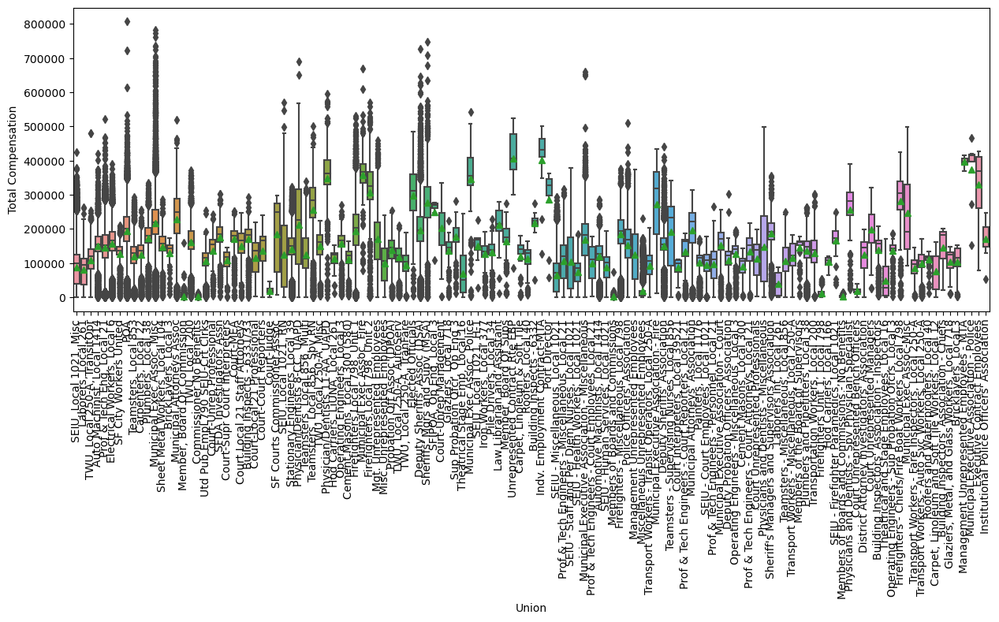

In [187]:
fig,ax=plt.subplots(figsize=(15,5))
sns.boxplot(x=df['Union'],y=df['Total Compensation'],showmeans=True)
ax.set_xticklabels(df['Union'].unique(),rotation=90)
plt.show()

In [100]:
#vs Employee Identifier

<Axes: xlabel='Employee Identifier', ylabel='Total Compensation'>

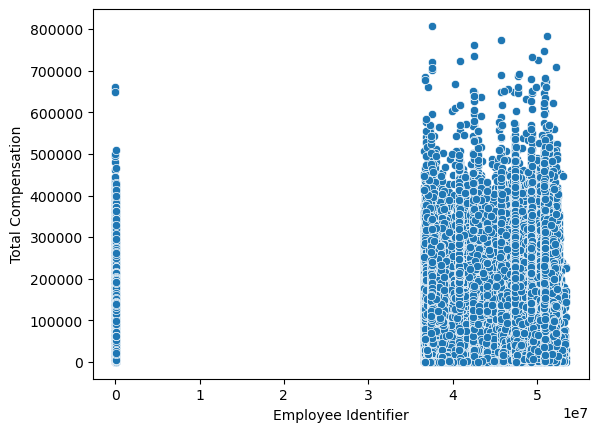

In [101]:
sns.scatterplot(x=df['Employee Identifier'],y=df['Total Compensation'])

<Axes: xlabel='Employee Identifier', ylabel='Total Compensation'>

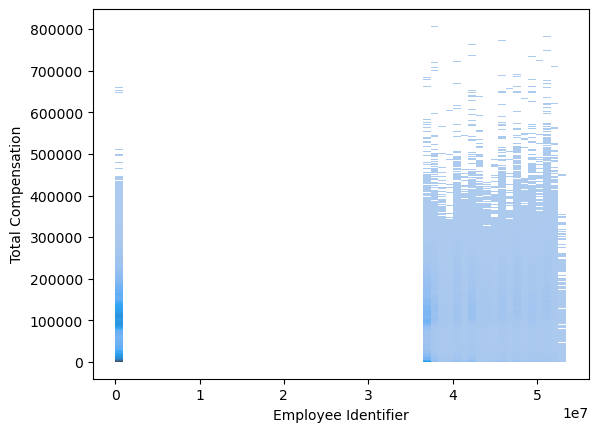

In [102]:
sns.histplot(x=df['Employee Identifier'],y=df['Total Compensation'])

In [103]:
#vs Salaries

<Axes: xlabel='Salaries', ylabel='Total Compensation'>

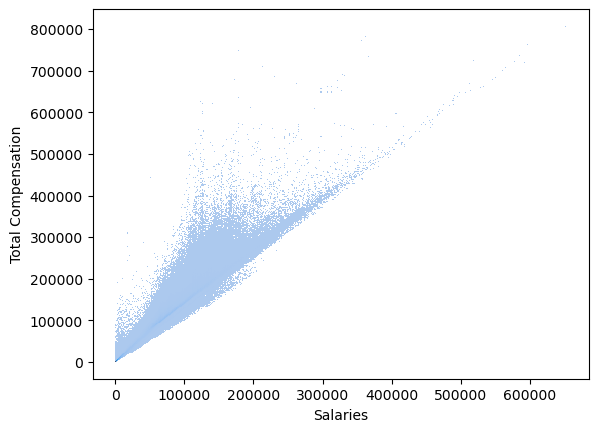

In [104]:
sns.histplot(x=df.Salaries,y=df['Total Compensation'])

In [105]:
#vs Overtime

<Axes: xlabel='Overtime', ylabel='Total Compensation'>

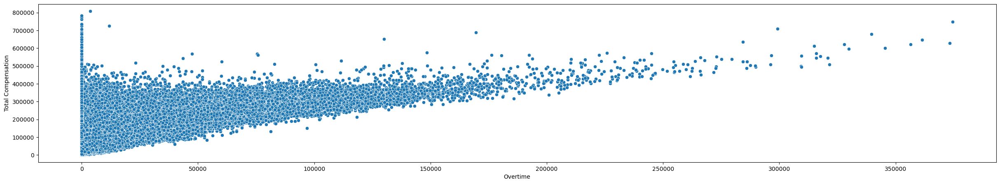

In [106]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Overtime'],y=df['Total Compensation'])

In [107]:
df.shape

(825766, 22)

In [108]:
# vs Other Salaries


<Axes: xlabel='Other Salaries', ylabel='Total Compensation'>

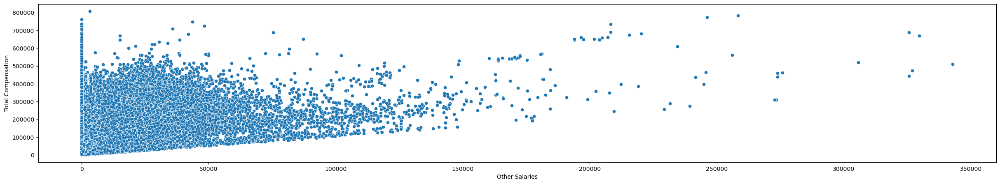

In [109]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Other Salaries'],y=df['Total Compensation'])

<Axes: xlabel='Other Salaries', ylabel='Total Compensation'>

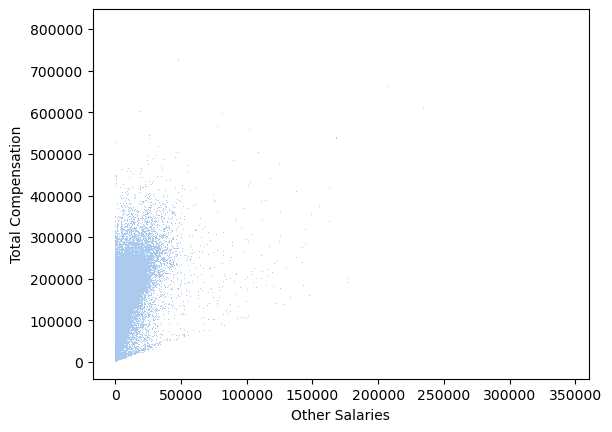

In [110]:
sns.histplot(x=df['Other Salaries'],y=df['Total Compensation'])

In [111]:
#vs Total Salary

<Axes: xlabel='Total Salary', ylabel='Total Compensation'>

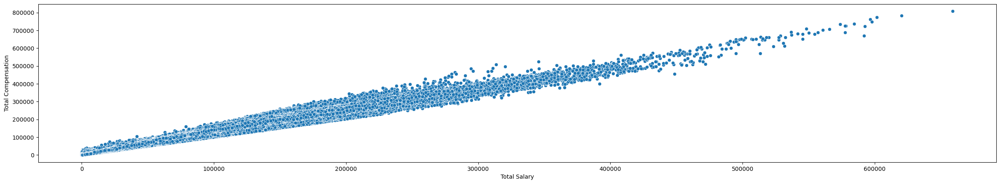

In [112]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Total Salary'],y=df['Total Compensation'])

In [113]:
#vs Retirement

<Axes: xlabel='Retirement', ylabel='Total Compensation'>

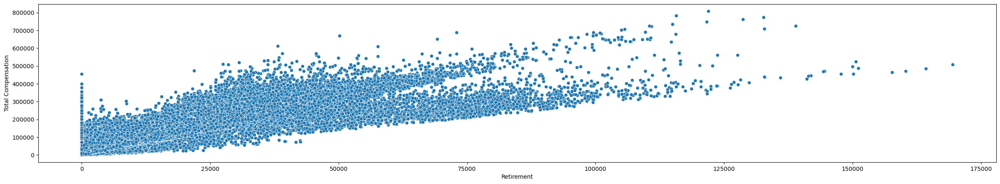

In [114]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Retirement'],y=df['Total Compensation'])

In [115]:
#vs Health and Dental


<Axes: xlabel='Health and Dental', ylabel='Total Compensation'>

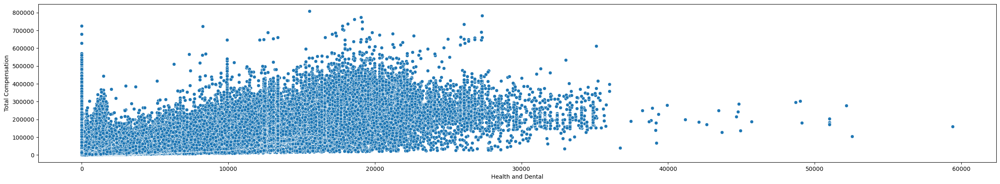

In [116]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Health and Dental'],y=df['Total Compensation'])

In [117]:
#vs Other Benefits

<Axes: xlabel='Other Benefits', ylabel='Total Compensation'>

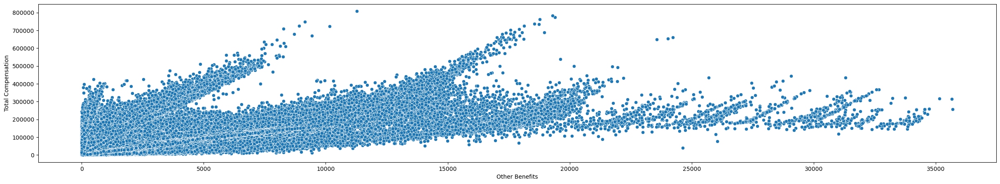

In [118]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Other Benefits'],y=df['Total Compensation'])

In [119]:
#vs Total Benefits

<Axes: xlabel='Total Benefits', ylabel='Total Compensation'>

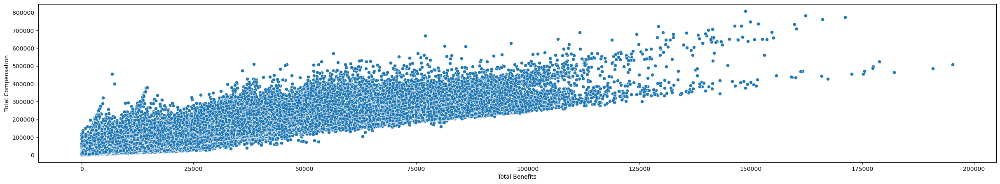

In [120]:
fig,ax=plt.subplots(figsize=(30,5))
sns.scatterplot(x=df['Total Benefits'],y=df['Total Compensation'])

C:\Users\Futurense\AppData\Local\Temp\ipykernel_16132\2782730492.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


<Axes: >

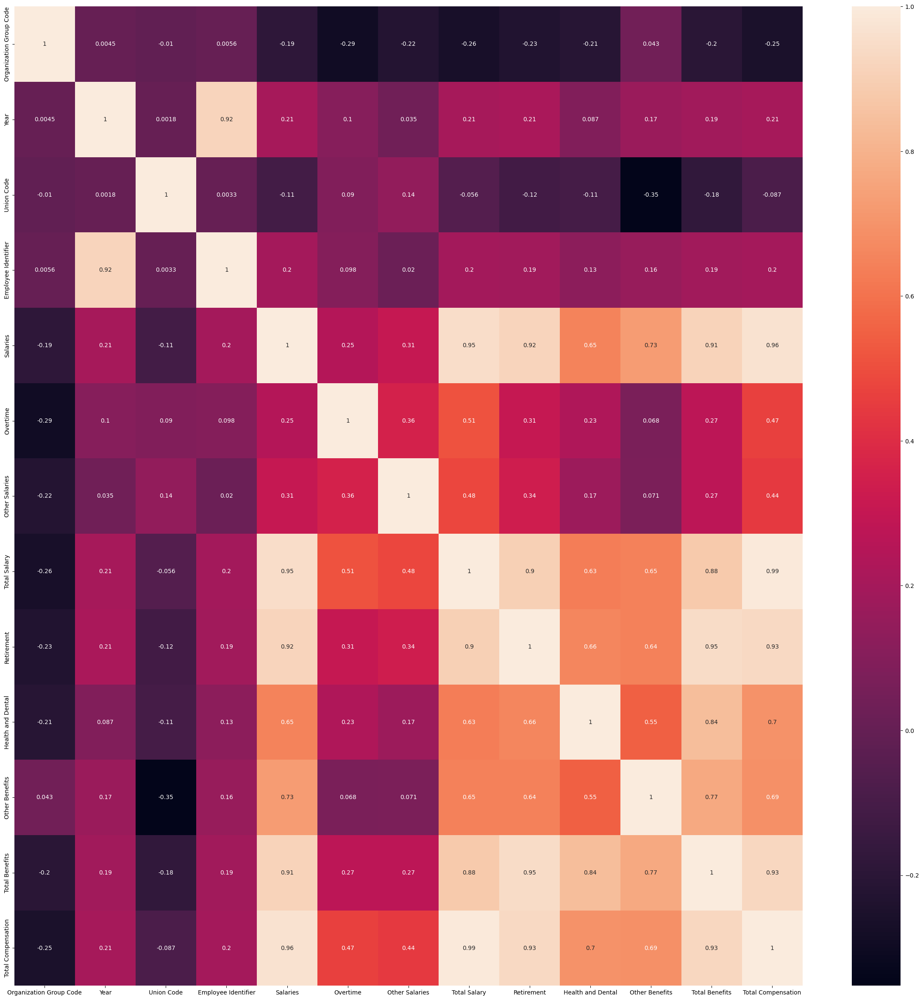

In [121]:
fig,ax=plt.subplots(figsize=(30,30))
sns.heatmap(df.corr(),annot=True)

# Level 3 Analysis


# 

In [122]:
#1

### Identify the top-paying departments in terms of average total compensation and determine the factors contributing to their higher compensation levels.

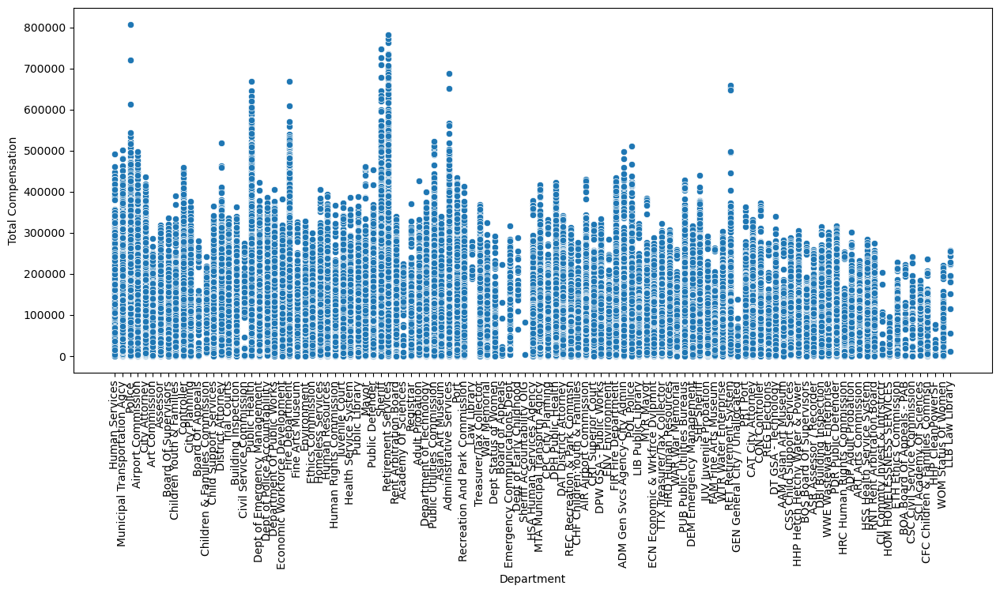

In [189]:
plt.figure(figsize=(15,6))
sns.scatterplot(x=df['Department'],y=df['Total Compensation'])
plt.xticks(rotation=90)
plt.show()

In [124]:
gd = df.groupby('Department')

acd = gd['Total Compensation'].mean()

asd= gd['Salaries'].mean()
aod= gd['Overtime'].mean()
abd= gd['Total Benefits'].mean()
ard= gd['Retirement'].mean()
ahdd= gd['Health and Dental'].mean()

dca = pd.DataFrame({
    'Average Total Compensation': acd,
    'Average Salaries': asd,
    'Average Overtime': aod,
    'Average Benefits': abd,
    'Average Retirement': ard,
    'Average Health and Dental': ahdd
})

tpd = dca.sort_values(by='Average Total Compensation', ascending=False)


print(tpd)

                                Average Total Compensation  Average Salaries  \
Department                                                                     
Law Library                                  231382.226250     166046.443333   
City Attorney                                201750.486543     147457.802124   
Fire Department                              195668.783381     112334.942381   
Sheriff                                      189741.148696      98379.988060   
LLB Law Library                              187457.892778     125025.977222   
...                                                    ...               ...   
HOM HOMELESSNESS SERVICES                     36710.029815      25553.754074   
HHP CleanPowerSF                              29308.076923      21007.795385   
REG Elections                                 20516.547695      13362.255129   
Registrar                                     20514.057264      14139.607630   
GEN General City / Unallocated          

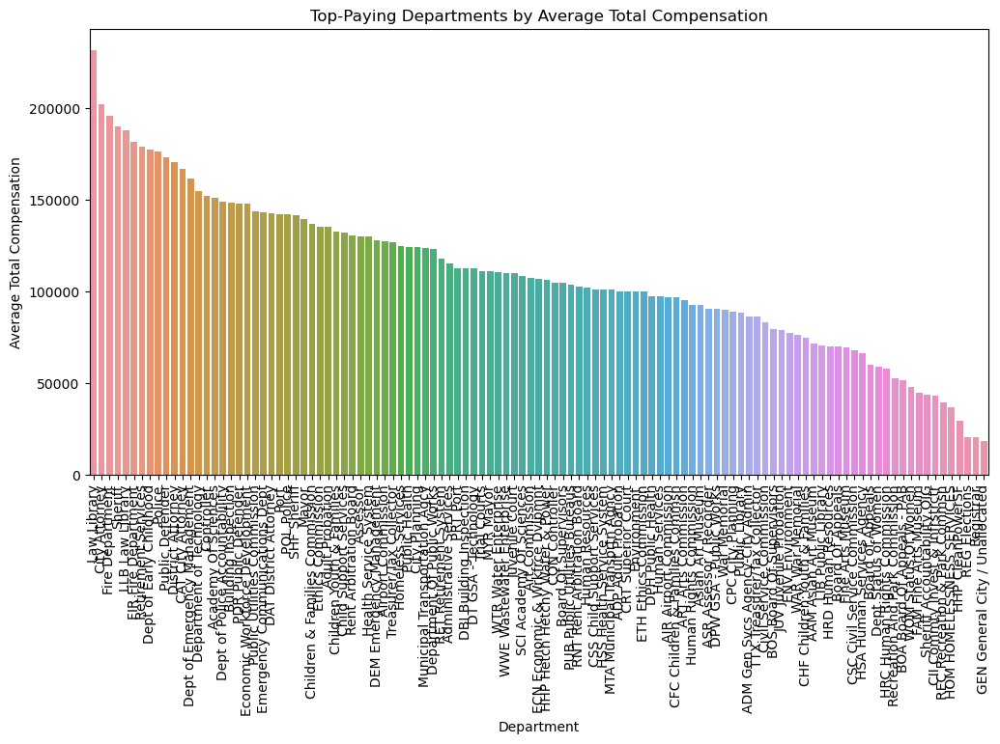

In [125]:

# Plotting the average total compensation for the top-paying departments
plt.figure(figsize=(12, 6))
sns.barplot(x=tpd.index, y='Average Total Compensation', data=tpd)
plt.xticks(rotation=90)
plt.title('Top-Paying Departments by Average Total Compensation')
plt.ylabel('Average Total Compensation')
plt.xlabel('Department')
plt.show()



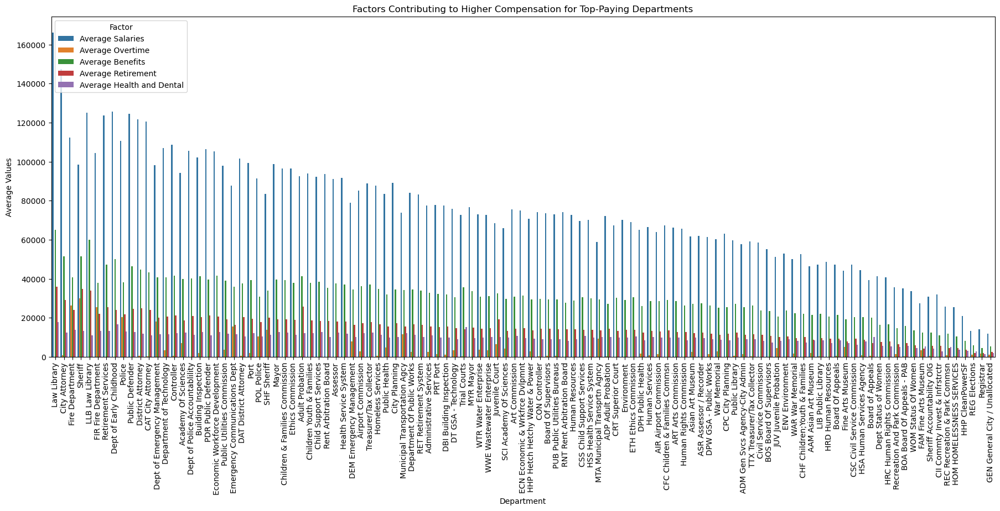

In [127]:

fc = ['Average Salaries', 'Average Overtime', 'Average Benefits', 'Average Retirement', 'Average Health and Dental']


tpd2 = tpd.reset_index().melt(id_vars='Department', value_vars=fc, var_name='Factor')

plt.figure(figsize=(22, 8))
sns.barplot(x='Department', y='value', hue='Factor', data=tpd2)
plt.xticks(rotation=90)
plt.title('Factors Contributing to Higher Compensation for Top-Paying Departments')
plt.ylabel('Average Values')
plt.xlabel('Department')
plt.legend(title='Factor', loc='upper left')
plt.show()

# 

In [128]:
#2

### Investigate the trends in employee compensation over the years, comparing fiscal and calendar years, and identify any significant changes or patterns.

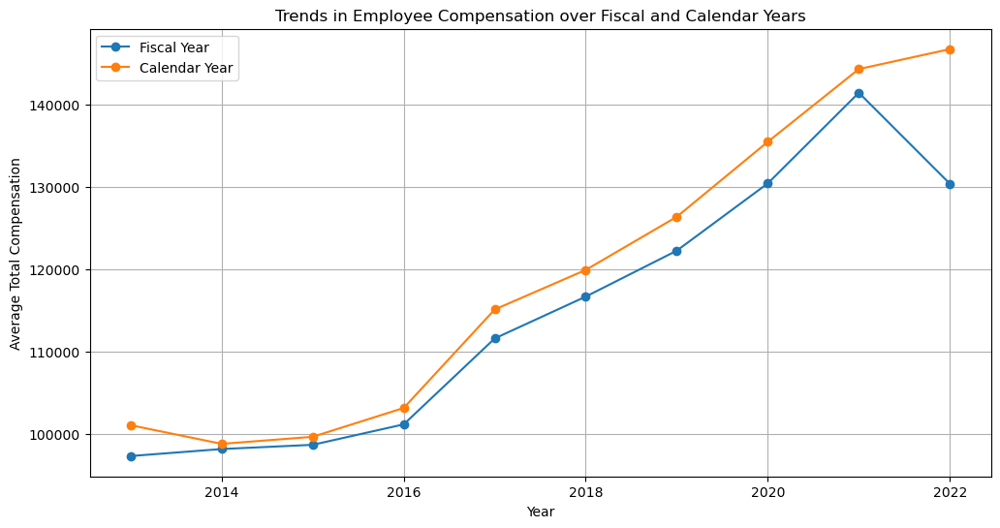

In [129]:
plt.figure(figsize=(12, 6))
plt.plot(df[df['Year Type'] == 'Fiscal'].groupby('Year')['Total Compensation'].mean().index, df[df['Year Type'] == 'Fiscal'].groupby('Year')['Total Compensation'].mean().values, label='Fiscal Year', marker='o')
plt.plot(df[df['Year Type'] == 'Calendar'].groupby('Year')['Total Compensation'].mean().index, df[df['Year Type'] == 'Calendar'].groupby('Year')['Total Compensation'].mean().values, label='Calendar Year', marker='o')
plt.xlabel('Year')
plt.ylabel('Average Total Compensation')
plt.title('Trends in Employee Compensation over Fiscal and Calendar Years')
plt.legend()
plt.grid(True)
plt.show()

# 

# 

In [130]:
#3

### Analyze the distribution of salaries and benefits to understand the overall compensation structure in San Francisco. Identify any outliers or anomalies in the data.

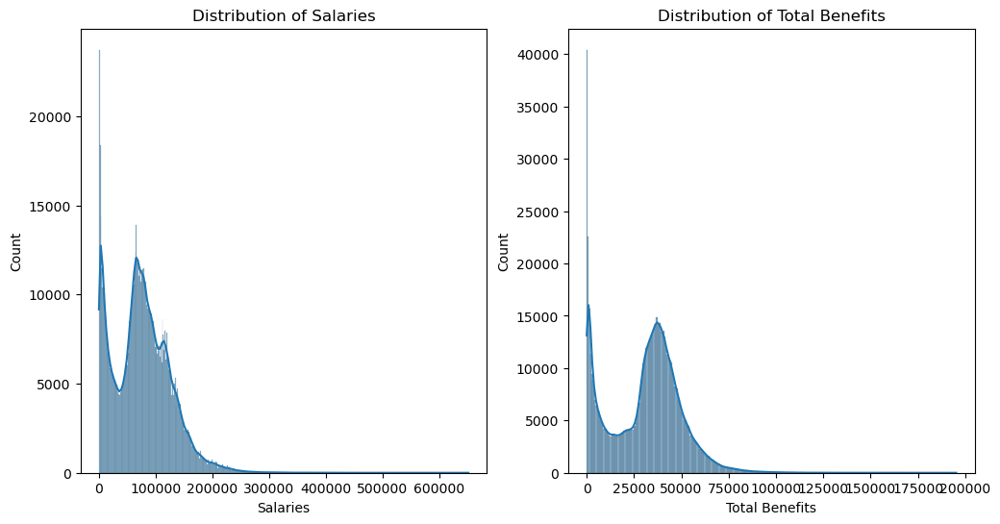

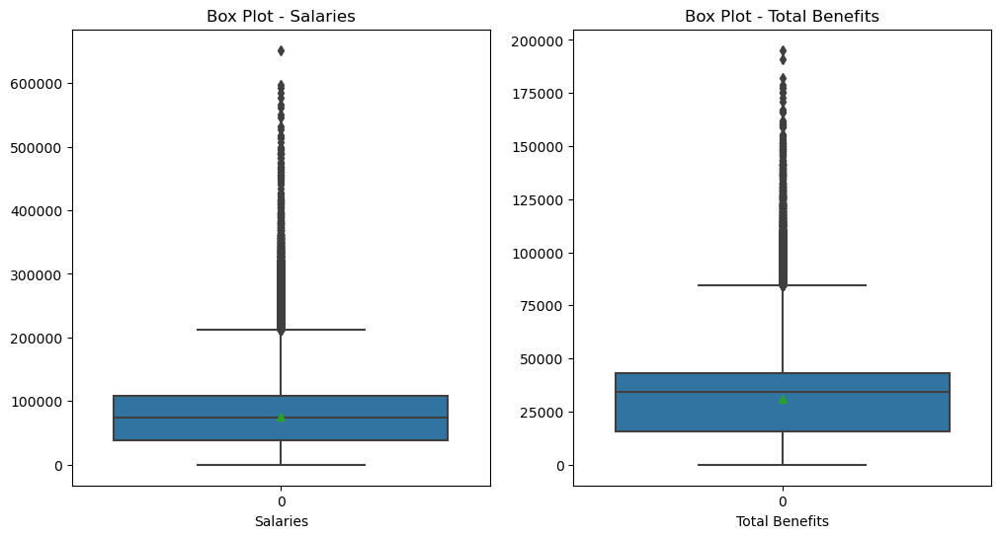

In [131]:
data=df.copy()
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(data['Salaries'], kde=True)
plt.xlabel('Salaries')
plt.title('Distribution of Salaries')

plt.subplot(1, 2, 2)
sns.histplot(data['Total Benefits'], kde=True)
plt.xlabel('Total Benefits')
plt.title('Distribution of Total Benefits')


plt.show()


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(data['Salaries'],showmeans=True)
plt.xlabel('Salaries')
plt.title('Box Plot - Salaries')

plt.subplot(1, 2, 2)
sns.boxplot(data['Total Benefits'],showmeans=True)
plt.xlabel('Total Benefits')
plt.title('Box Plot - Total Benefits')


plt.show()

# 

# 

### 4. Examine the relationship between salaries, overtime, and other forms of compensation to determine if certain job families or departments have higher instances of overtime or irregular payments.

In [143]:
data['Job Family'].nunique()

59

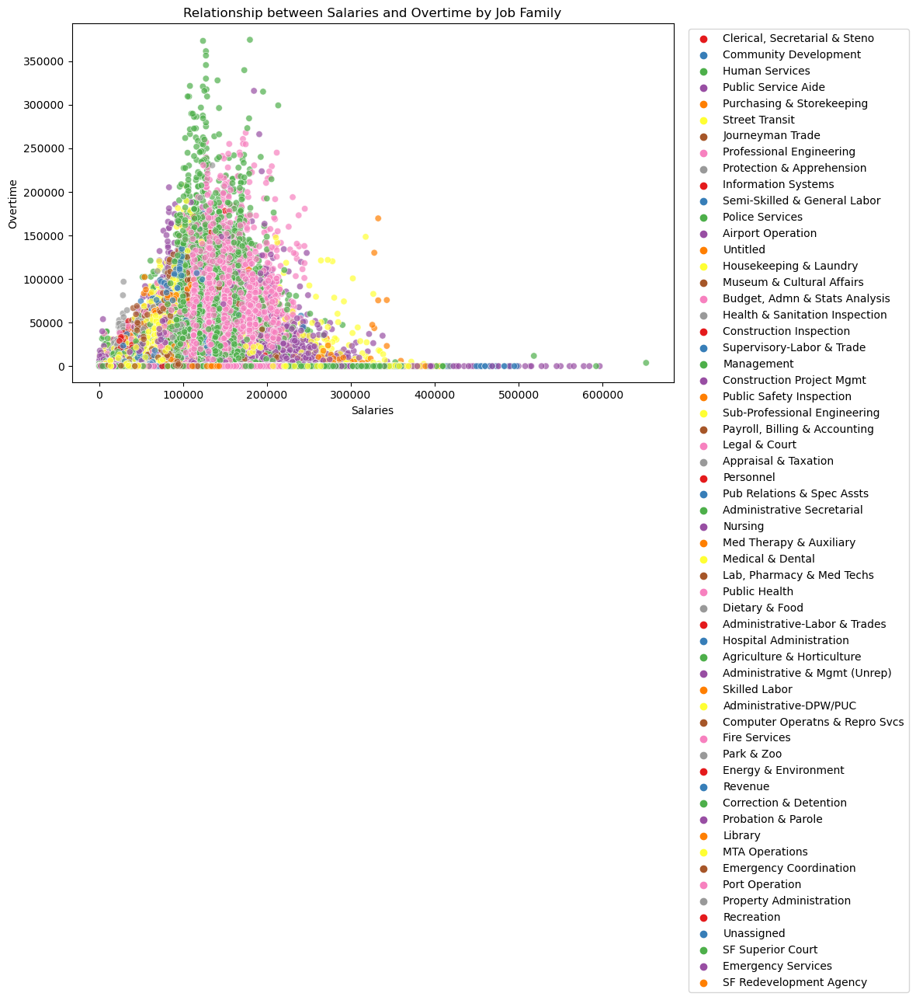

In [148]:
data = df.copy()

# Scatter plot to examine the relationship between salaries, overtime, and other salaries
color_palette = sns.color_palette('tab20', n_colors=data['Job Family'].nunique())
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Salaries', y='Overtime', hue='Job Family', data=data, alpha=0.7, palette='Set1', legend='full')
plt.xlabel('Salaries')
plt.ylabel('Overtime')
plt.title('Relationship between Salaries and Overtime by Job Family')
plt.legend(loc='upper right', bbox_to_anchor=(1.4, 1))
plt.show()



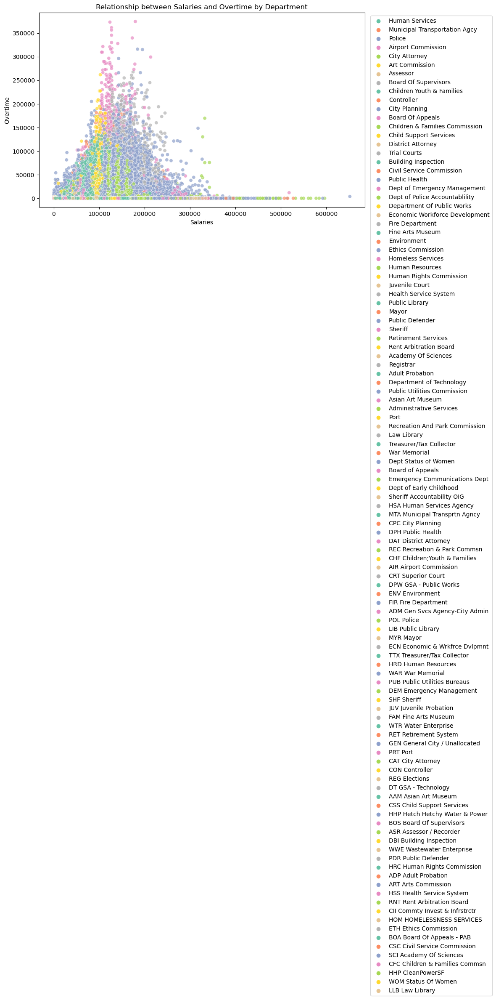

In [149]:
# Scatter plot to examine the relationship between salaries, overtime, and other salaries by department
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Salaries', y='Overtime', hue='Department', data=data, alpha=0.7, palette='Set2', legend='full')
plt.xlabel('Salaries')
plt.ylabel('Overtime')
plt.title('Relationship between Salaries and Overtime by Department')
plt.legend(loc='upper right', bbox_to_anchor=(1.4, 1))
plt.show()



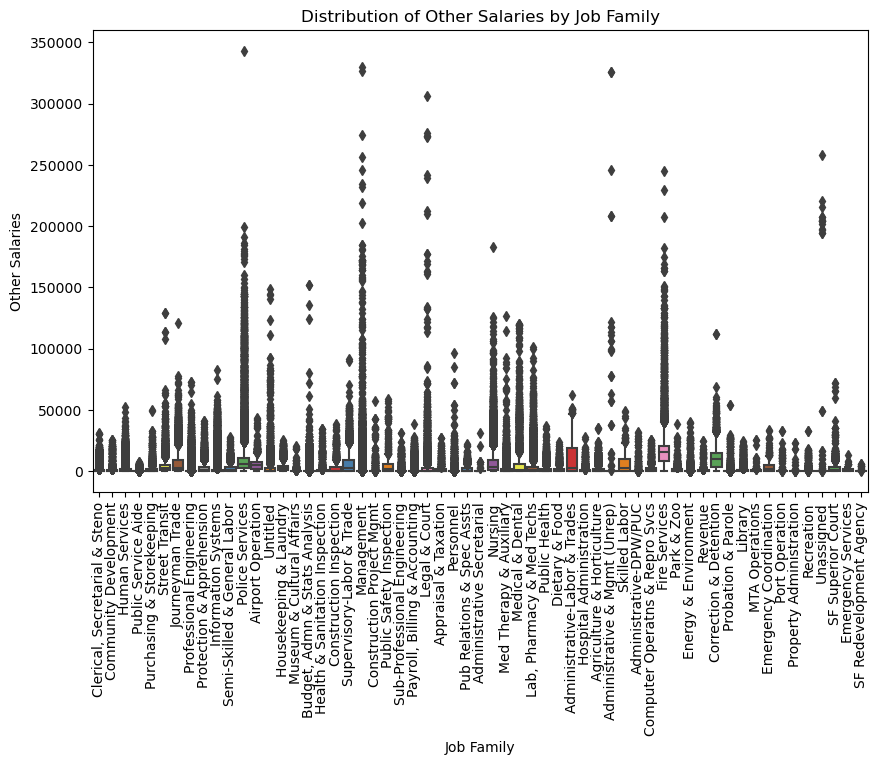

In [150]:
# Box plot to examine the distribution of other salaries for each job family
plt.figure(figsize=(10, 6))
sns.boxplot(x='Job Family', y='Other Salaries', data=data, palette='Set1')
plt.xlabel('Job Family')
plt.ylabel('Other Salaries')
plt.title('Distribution of Other Salaries by Job Family')
plt.xticks(rotation=90)
plt.show()



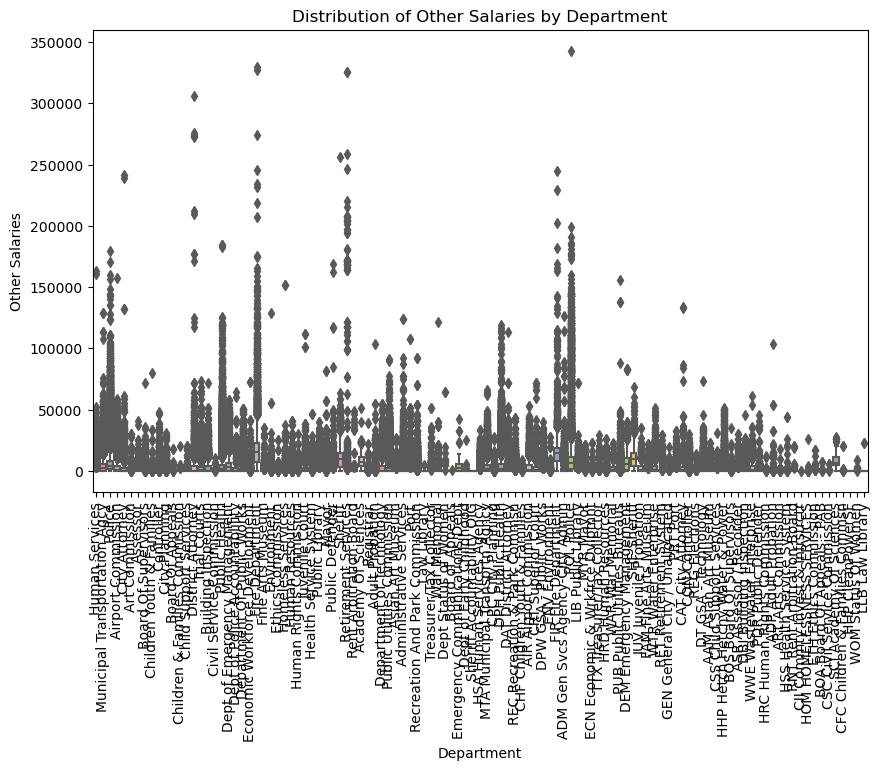

In [151]:
# Box plot to examine the distribution of other salaries for each department
plt.figure(figsize=(10, 6))
sns.boxplot(x='Department', y='Other Salaries', data=data, palette='Set2')
plt.xlabel('Department')
plt.ylabel('Other Salaries')
plt.title('Distribution of Other Salaries by Department')
plt.xticks(rotation=90)
plt.show()

# 

### 5. Explore the distribution of benefits across different organization groups and unions to understand the variations in benefit packages provided to employees.

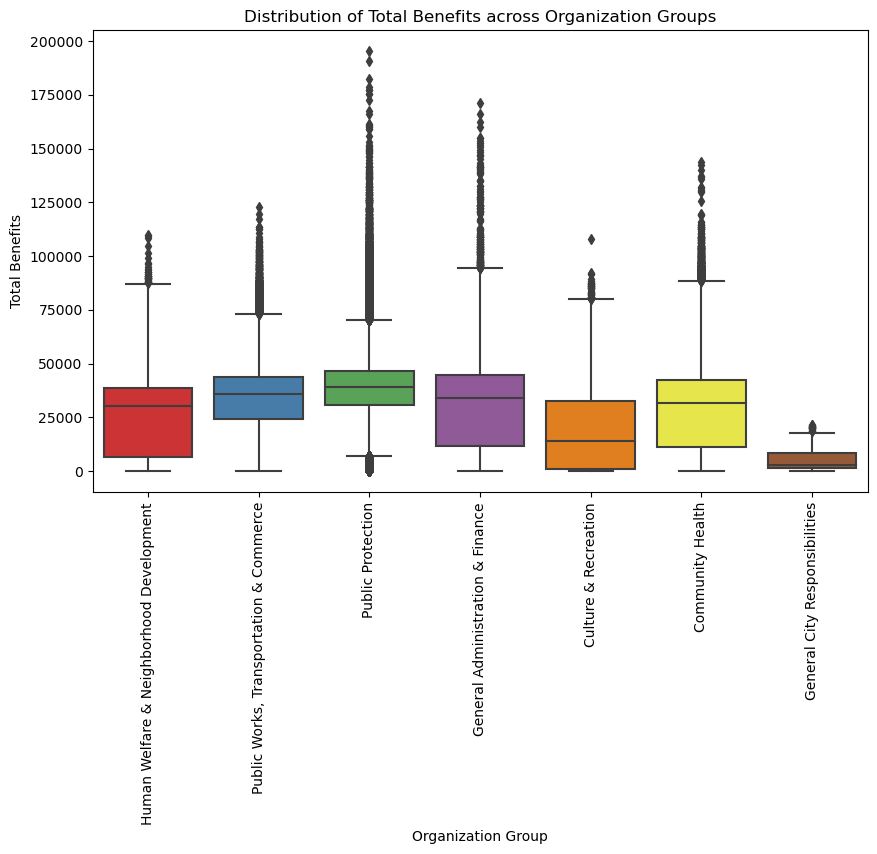

In [152]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Organization Group', y='Total Benefits', data=data, palette='Set1')
plt.xlabel('Organization Group')
plt.ylabel('Total Benefits')
plt.title('Distribution of Total Benefits across Organization Groups')
plt.xticks(rotation=90)
plt.show()



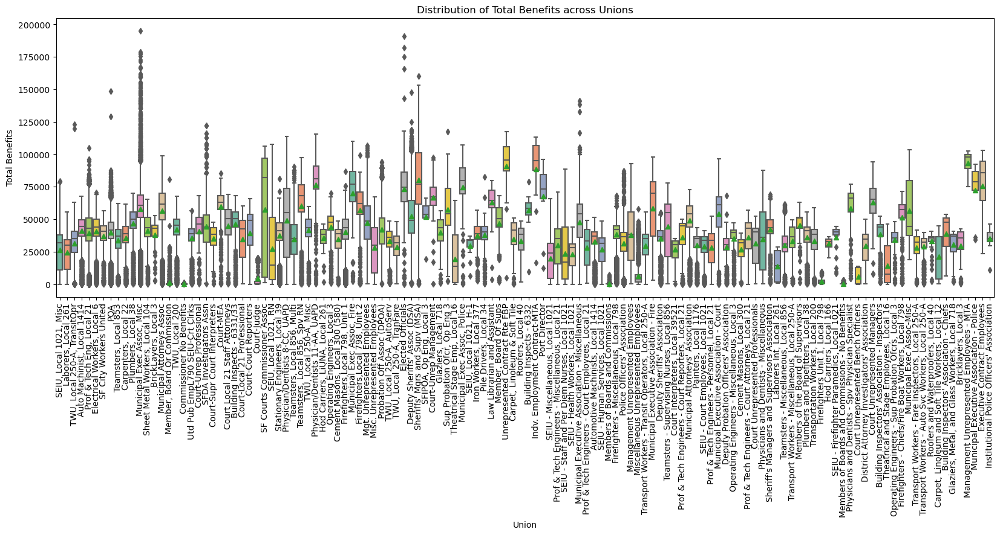

In [153]:
# Box plot to examine the distribution of total benefits across different unions
plt.figure(figsize=(20, 6))
sns.boxplot(x='Union', y='Total Benefits', data=data, palette='Set2',showmeans=True)
plt.xlabel('Union')
plt.ylabel('Total Benefits')
plt.title('Distribution of Total Benefits across Unions')
plt.xticks(rotation=90)
plt.show()



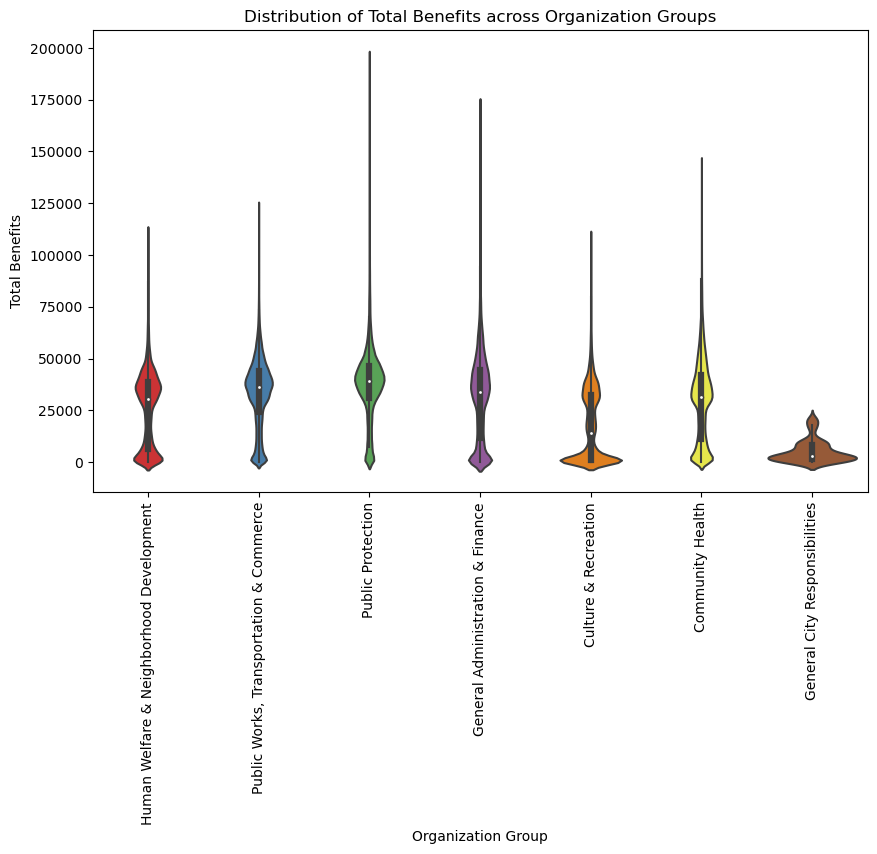

In [154]:
# Violin plot to examine the distribution of total benefits across different organization groups
plt.figure(figsize=(10, 6))
sns.violinplot(x='Organization Group', y='Total Benefits', data=data, palette='Set1')
plt.xlabel('Organization Group')
plt.ylabel('Total Benefits')
plt.title('Distribution of Total Benefits across Organization Groups')
plt.xticks(rotation=90)
plt.show()



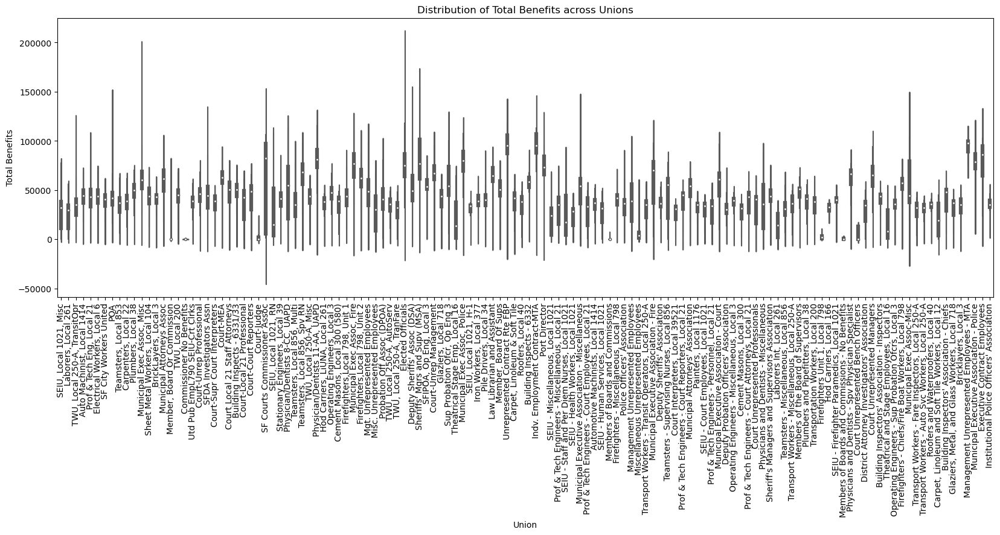

In [155]:
# Violin plot to examine the distribution of total benefits across different unions
plt.figure(figsize=(20, 6))
sns.violinplot(x='Union', y='Total Benefits', data=data, palette='Set2')
plt.xlabel('Union')
plt.ylabel('Total Benefits')
plt.title('Distribution of Total Benefits across Unions')
plt.xticks(rotation=90)
plt.show()

# 

### 6. Investigate the impact of job family on compensation levels and identify the job families with the highest and lowest average total compensation.

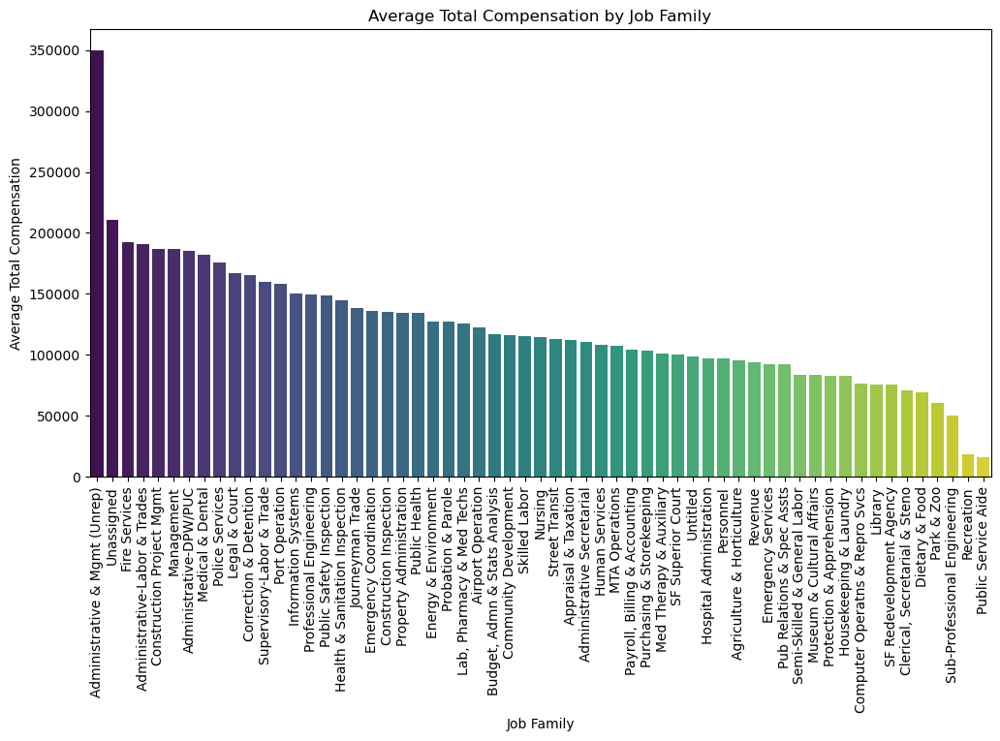

Highest Paying Job Family: Administrative & Mgmt (Unrep) (Average Total Compensation: $349703.59)
Lowest Paying Job Family: Public Service Aide (Average Total Compensation: $15997.96)


In [156]:
acjb = data.groupby('Job Family')['Total Compensation'].mean()


sjb = acjb.sort_values(ascending=False)


plt.figure(figsize=(12, 6))
sns.barplot(x=sjb.index, y=sjb.values, palette='viridis')
plt.xticks(rotation=90)
plt.xlabel('Job Family')
plt.ylabel('Average Total Compensation')
plt.title('Average Total Compensation by Job Family')
plt.show()


hpjf = sjb.index[0]
lpjf = sjb.index[-1]

print(f"Highest Paying Job Family: {hpjf} (Average Total Compensation: ${sjb.iloc[0]:.2f})")
print(f"Lowest Paying Job Family: {lpjf} (Average Total Compensation: ${sjb.iloc[-1]:.2f})")

# 

### 7. Analyze the proportion of benefits in total compensation and assess how it varies across different departments and job families

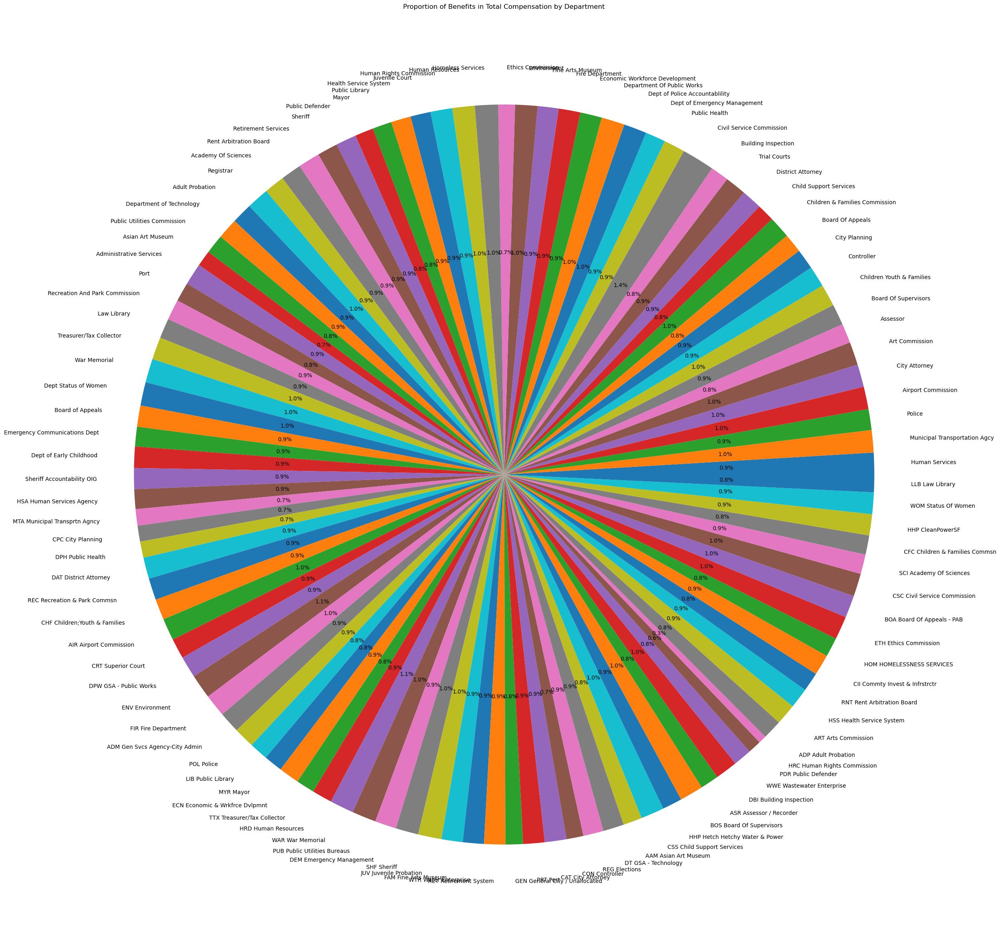

In [193]:
data['Benefits Proportion'] = data['Total Benefits'] / data['Total Compensation'] * 100

plt.figure(figsize=(30, 30))
plt.title('Proportion of Benefits in Total Compensation by Department')
plt.pie(data.groupby('Department')['Benefits Proportion'].mean(), labels=data['Department'].unique(), autopct='%1.1f%%')
plt.show()



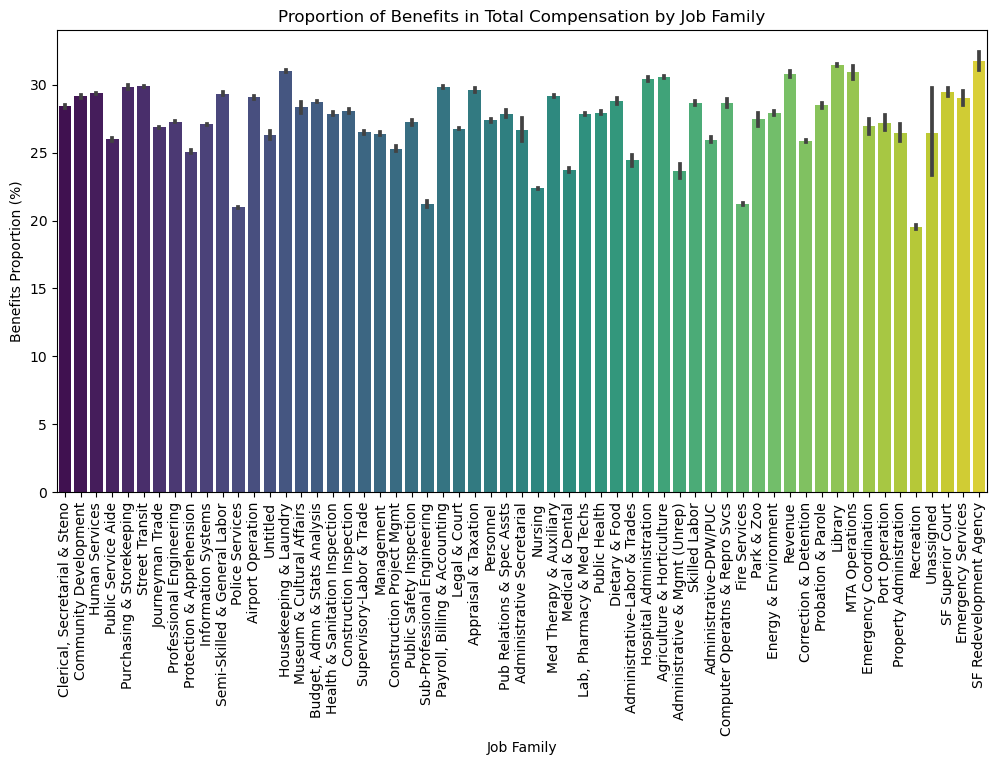

In [158]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Job Family', y='Benefits Proportion', data=data, palette='viridis')
plt.xticks(rotation=90)
plt.xlabel('Job Family')
plt.ylabel('Benefits Proportion (%)')
plt.title('Proportion of Benefits in Total Compensation by Job Family')
plt.show()

# 

### 8. Identify any correlations between employee compensation and factors such as years of service, job level, or union affiliation.

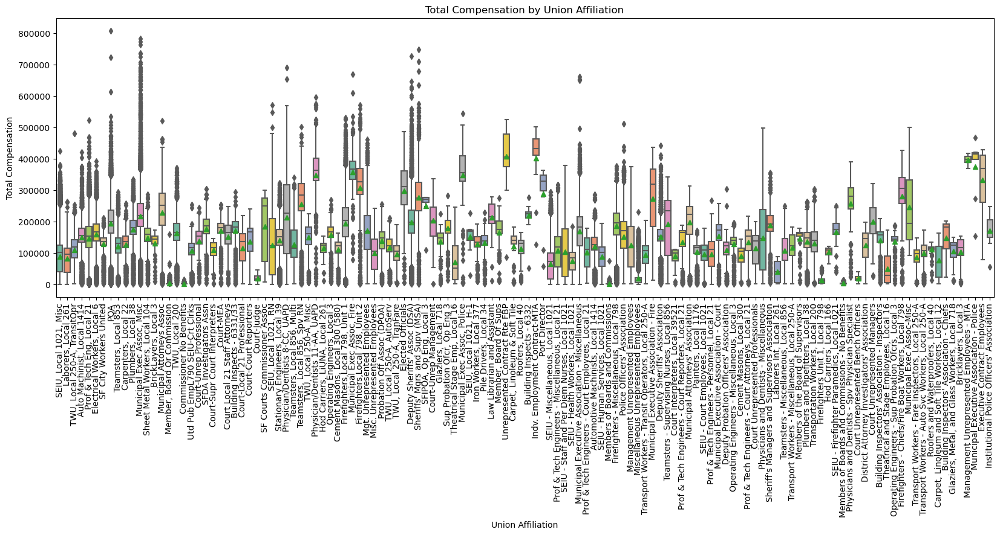

In [159]:
#  union 
plt.figure(figsize=(20, 6))
sns.boxplot(x='Union', y='Total Compensation', data=data, palette='Set2',showmeans=True)
plt.xlabel('Union Affiliation')
plt.ylabel('Total Compensation')
plt.title('Total Compensation by Union Affiliation')
plt.xticks(rotation=90)
plt.show()

C:\Users\Futurense\AppData\Local\Temp\ipykernel_16132\3685277395.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='Year', y='Total Compensation', data=data, palette='Set2')


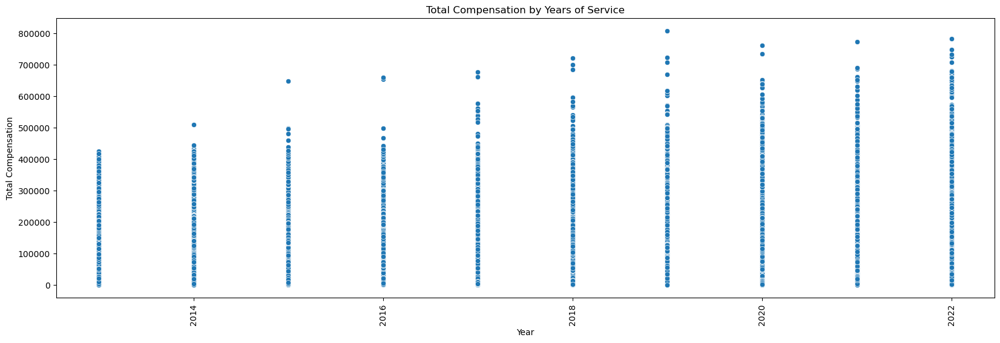

In [168]:
plt.figure(figsize=(20, 6))
sns.scatterplot(x='Year', y='Total Compensation', data=data, palette='Set2')
plt.xlabel('Year')
plt.ylabel('Total Compensation')
plt.title('Total Compensation by Years of Service')
plt.xticks(rotation=90)
plt.show()

C:\Users\Futurense\AppData\Local\Temp\ipykernel_16132\3807700432.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)


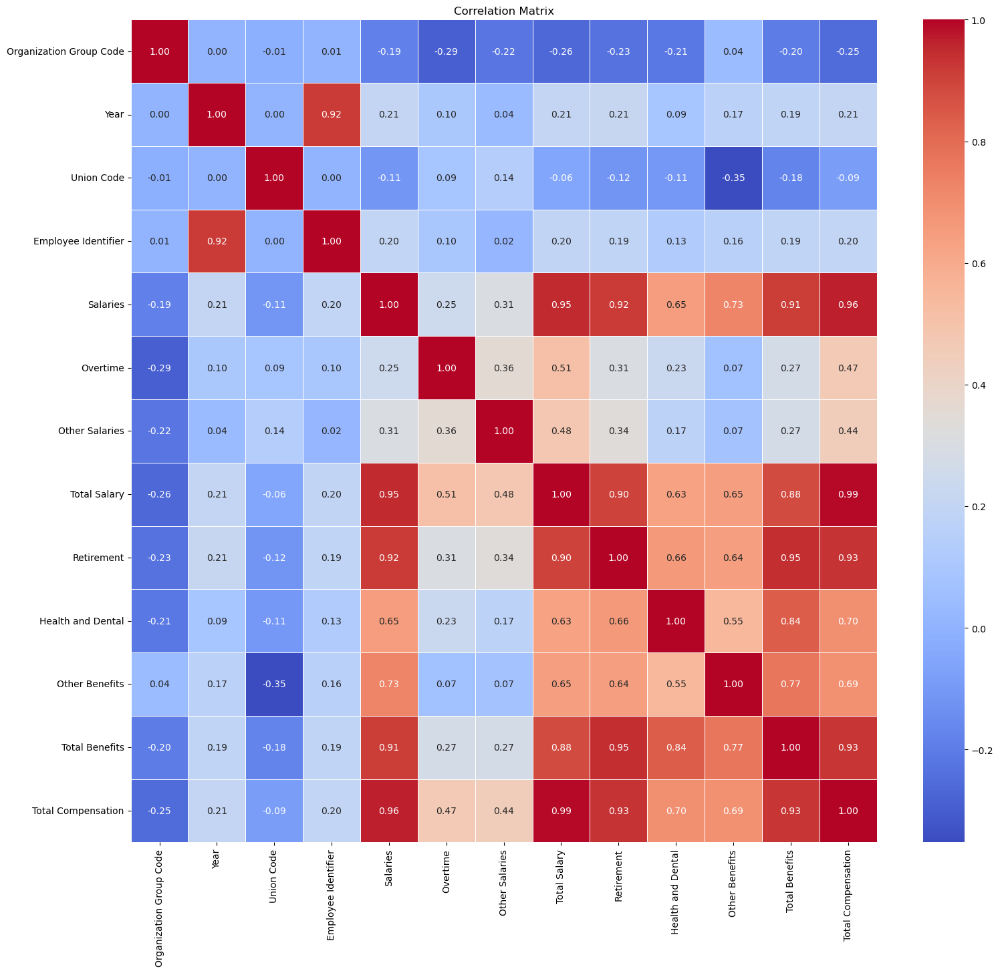

In [160]:
# Heatmap

plt.figure(figsize=(18, 16))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# 

### 9. Assess the impact of retirement contributions and health/dental benefits on total compensation and explore any variations across departments or job families.

# 

### 10. Analyze which department's clerk takes maximum salary. Display top 5 departments which pay maximum salary to clerks.

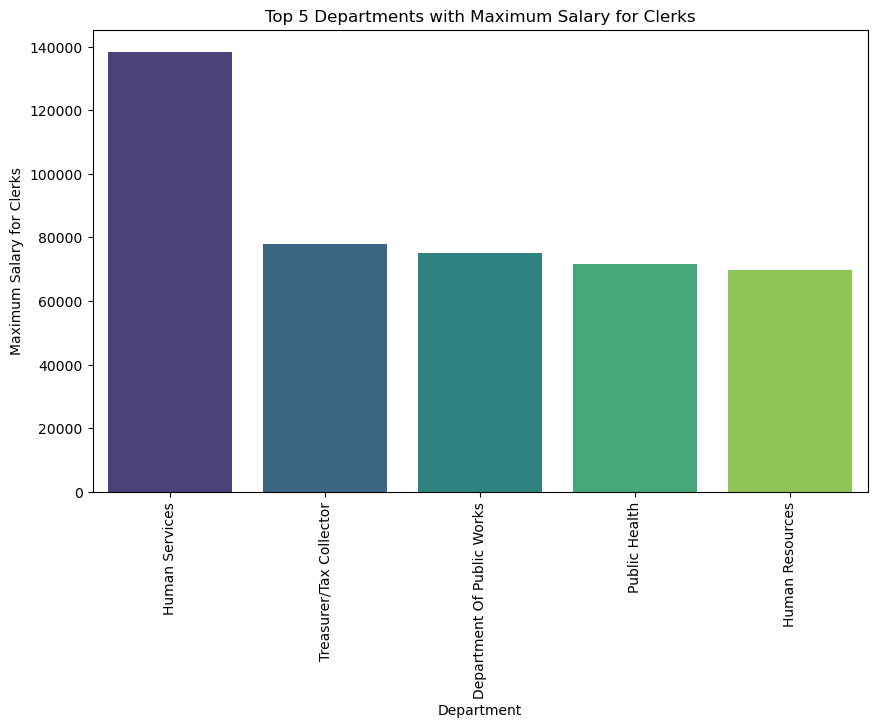

In [165]:
clerks_data = data[data['Job'] == 'Clerk']

max_salary = clerks_data.groupby('Department')['Salaries'].max()

top_clerk = max_salary.sort_values(ascending=False).head(5)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_clerk.index, y=top_clerk.values, palette='viridis')
plt.xlabel('Department')
plt.ylabel('Maximum Salary for Clerks')
plt.title('Top 5 Departments with Maximum Salary for Clerks')
plt.xticks(rotation=90)
plt.show()